In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import signal
import librosa
import librosa.display
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

In [5]:
audio_files = [
    "music.mp3",
    "text_2.mp3",
    "street.mp3",
    "rain.mp3",
    "birds.mp3"
]

loaded_audio = {}
for i, file_path in enumerate(audio_files):
    try:
        print(f"Загрузка файла {i+1}: {file_path}")
        y, sr = librosa.load(file_path, sr=None)
        loaded_audio[f"audio_{i+1}"] = {
            'signal': y,
            'sr': sr,
            'filename': file_path
        }
        print(f"Частота дискретизации: {sr} Hz")
        print(f"Длительность: {len(y)/sr:.2f} секунд")
        print(f"Отсчетов: {len(y)}\n")
    except Exception as e:
        print(f"Ошибка загрузки: {e}\n")

print(f"Загружено файлов: {len(loaded_audio)}/{len(audio_files)}")

Загрузка файла 1: music.mp3
Частота дискретизации: 44100 Hz
Длительность: 119.51 секунд
Отсчетов: 5270400

Загрузка файла 2: text_2.mp3
Частота дискретизации: 44100 Hz
Длительность: 185.63 секунд
Отсчетов: 8186283

Загрузка файла 3: street.mp3
Частота дискретизации: 44100 Hz
Длительность: 53.47 секунд
Отсчетов: 2358144

Загрузка файла 4: rain.mp3
Частота дискретизации: 44100 Hz
Длительность: 41.77 секунд
Отсчетов: 1841859

Загрузка файла 5: birds.mp3
Частота дискретизации: 24000 Hz
Длительность: 60.38 секунд
Отсчетов: 1449134

Загружено файлов: 5/5


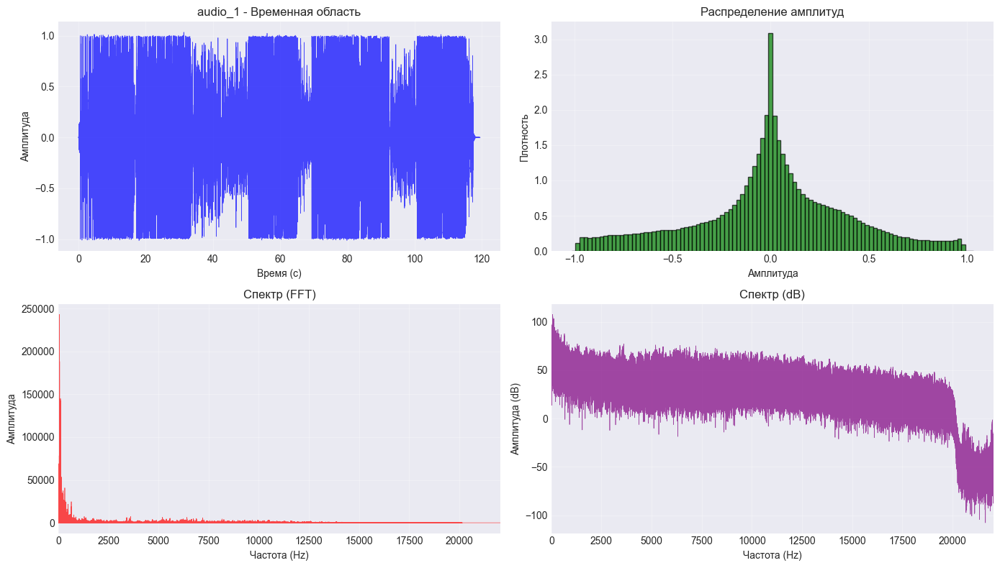

In [6]:
if loaded_audio:
    key = list(loaded_audio.keys())[0]
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    fig, axes = plt.subplots(2, 2, figsize=(14, 8))

    time = np.arange(len(y)) / sr
    axes[0, 0].plot(time, y, color='blue', alpha=0.7, linewidth=0.5)
    axes[0, 0].set_title(f'{key} - Временная область')
    axes[0, 0].set_xlabel('Время (с)')
    axes[0, 0].set_ylabel('Амплитуда')
    axes[0, 0].grid(True, alpha=0.3)

    axes[0, 1].hist(y, bins=100, density=True, alpha=0.7, color='green', edgecolor='black')
    axes[0, 1].set_title('Распределение амплитуд')
    axes[0, 1].set_xlabel('Амплитуда')
    axes[0, 1].set_ylabel('Плотность')
    axes[0, 1].grid(True, alpha=0.3)

    n = len(y)
    Y = np.fft.fft(y)
    Y_mag = np.abs(Y[:n//2])
    freq = np.fft.fftfreq(n, 1/sr)[:n//2]

    axes[1, 0].plot(freq, Y_mag, color='red', alpha=0.7, linewidth=0.5)
    axes[1, 0].set_title('Спектр (FFT)')
    axes[1, 0].set_xlabel('Частота (Hz)')
    axes[1, 0].set_ylabel('Амплитуда')
    axes[1, 0].set_xlim([0, sr/2])
    axes[1, 0].grid(True, alpha=0.3)

    axes[1, 1].plot(freq, 20*np.log10(Y_mag + 1e-10), color='purple', alpha=0.7, linewidth=0.5)
    axes[1, 1].set_title('Спектр (dB)')
    axes[1, 1].set_xlabel('Частота (Hz)')
    axes[1, 1].set_ylabel('Амплитуда (dB)')
    axes[1, 1].set_xlim([0, sr/2])
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

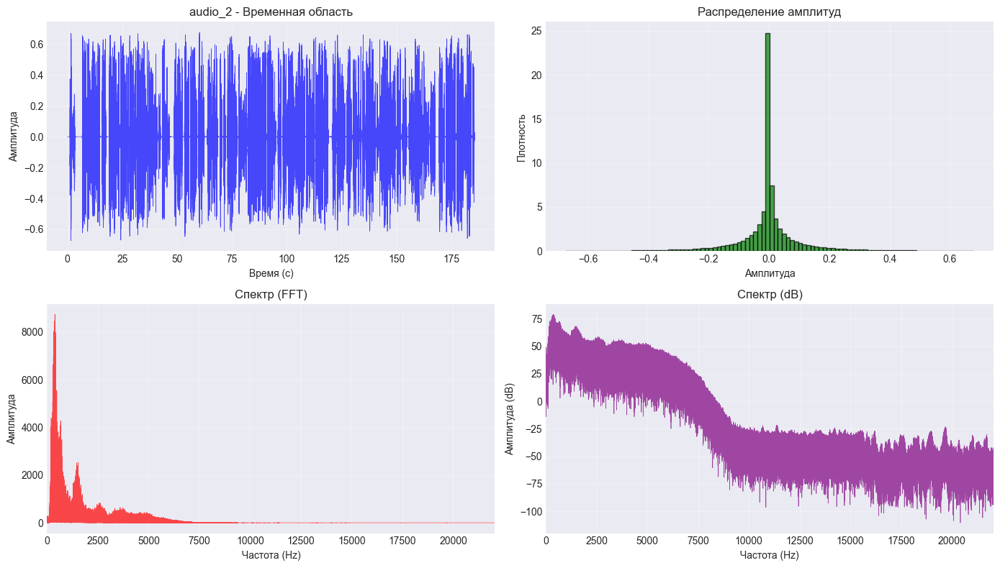

In [7]:
if loaded_audio:
    key = list(loaded_audio.keys())[1]
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    fig, axes = plt.subplots(2, 2, figsize=(14, 8))

    time = np.arange(len(y)) / sr
    axes[0, 0].plot(time, y, color='blue', alpha=0.7, linewidth=0.5)
    axes[0, 0].set_title(f'{key} - Временная область')
    axes[0, 0].set_xlabel('Время (с)')
    axes[0, 0].set_ylabel('Амплитуда')
    axes[0, 0].grid(True, alpha=0.3)

    axes[0, 1].hist(y, bins=100, density=True, alpha=0.7, color='green', edgecolor='black')
    axes[0, 1].set_title('Распределение амплитуд')
    axes[0, 1].set_xlabel('Амплитуда')
    axes[0, 1].set_ylabel('Плотность')
    axes[0, 1].grid(True, alpha=0.3)

    n = len(y)
    Y = np.fft.fft(y)
    Y_mag = np.abs(Y[:n//2])
    freq = np.fft.fftfreq(n, 1/sr)[:n//2]

    axes[1, 0].plot(freq, Y_mag, color='red', alpha=0.7, linewidth=0.5)
    axes[1, 0].set_title('Спектр (FFT)')
    axes[1, 0].set_xlabel('Частота (Hz)')
    axes[1, 0].set_ylabel('Амплитуда')
    axes[1, 0].set_xlim([0, sr/2])
    axes[1, 0].grid(True, alpha=0.3)

    axes[1, 1].plot(freq, 20*np.log10(Y_mag + 1e-10), color='purple', alpha=0.7, linewidth=0.5)
    axes[1, 1].set_title('Спектр (dB)')
    axes[1, 1].set_xlabel('Частота (Hz)')
    axes[1, 1].set_ylabel('Амплитуда (dB)')
    axes[1, 1].set_xlim([0, sr/2])
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

СТАТИСТИЧЕСКИЕ ХАРАКТЕРИСТИКИ

audio_1 (music.mp3):
  Среднее: 0.001004
  Медиана: 0.003616
  Стандартное отклонение: 0.388700
  Дисперсия: 0.151087
  Минимум: -1.014598
  Максимум: 1.034152
  Размах (мах-мин): 2.048750
  RMS: 0.388701
  Средняя мощность: 0.151088
  Динамический диапазон (dB): 8.499402

audio_2 (text_2.mp3):
  Среднее: 0.000014
  Медиана: -0.000000
  Стандартное отклонение: 0.110446
  Дисперсия: 0.012198
  Минимум: -0.672953
  Максимум: 0.677563
  Размах (мах-мин): 1.350517
  RMS: 0.110446
  Средняя мощность: 0.012198
  Динамический диапазон (dB): 15.756008

audio_3 (street.mp3):
  Среднее: -0.000280
  Медиана: -0.000189
  Стандартное отклонение: 0.065530
  Дисперсия: 0.004294
  Минимум: -0.937124
  Максимум: 0.811300
  Размах (мах-мин): 1.748424
  RMS: 0.065531
  Средняя мощность: 0.004294
  Динамический диапазон (dB): 23.107109

audio_4 (rain.mp3):
  Среднее: 0.000005
  Медиана: -0.000018
  Стандартное отклонение: 0.055265
  Дисперсия: 0.003054
  Минимум: -0.970711
 

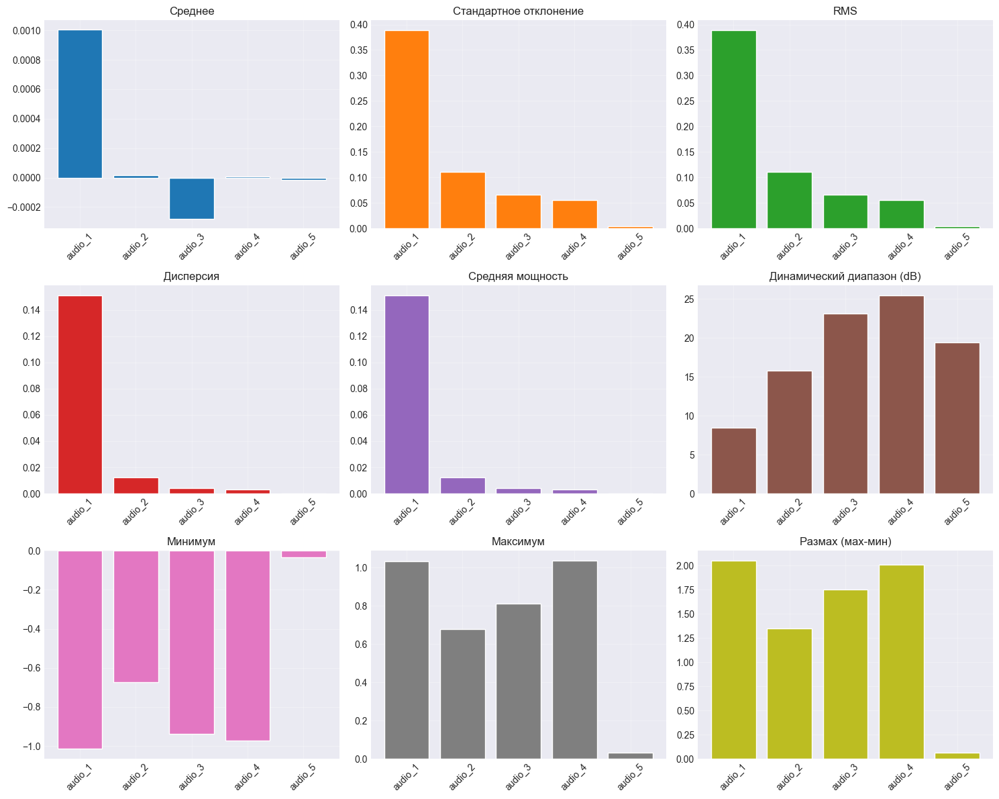

In [8]:
print("СТАТИСТИЧЕСКИЕ ХАРАКТЕРИСТИКИ")
print("="*80)

all_stats = {}
for key in loaded_audio.keys():
    y = loaded_audio[key]['signal']

    stats = {
        'Среднее': np.mean(y),
        'Медиана': np.median(y),
        'Стандартное отклонение': np.std(y),
        'Дисперсия': np.var(y),
        'Минимум': np.min(y),
        'Максимум': np.max(y),
        'Размах (мах-мин)': np.ptp(y),
        'RMS': np.sqrt(np.mean(y**2)),
        'Средняя мощность': np.mean(y**2),
        'Динамический диапазон (dB)': 20 * np.log10(np.max(np.abs(y)) / (np.std(y) + 1e-10))
    }

    all_stats[key] = stats

    print(f"\n{key} ({loaded_audio[key]['filename']}):")
    for stat_name, value in stats.items():
        print(f"  {stat_name}: {value:.6f}")

if len(all_stats) > 1:
    fig, axes = plt.subplots(3, 3, figsize=(15, 12))
    axes = axes.flatten()

    stat_names = ['Среднее', 'Стандартное отклонение', 'RMS',
                  'Дисперсия', 'Средняя мощность', 'Динамический диапазон (dB)',
                  'Минимум', 'Максимум', 'Размах (мах-мин)']

    for i, stat_name in enumerate(stat_names[:9]):
        values = [all_stats[key][stat_name] for key in all_stats.keys()]
        axes[i].bar(range(len(values)), values, color=plt.cm.tab10(i))
        axes[i].set_title(stat_name)
        axes[i].set_xticks(range(len(values)))
        axes[i].set_xticklabels(list(all_stats.keys()), rotation=45)
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

FFT АНАЛИЗ

audio_1:
  Максимальная амплитуда в частотной области: 243199.2969
  Доминирующие частоты:
    1. 61.3 Hz (амплитуда: 201091.9375)
    2. 55.1 Hz (амплитуда: 203906.1719)
    3. 55.1 Hz (амплитуда: 214049.6250)
    4. 56.1 Hz (амплитуда: 221409.4062)
    5. 53.7 Hz (амплитуда: 243199.2969)


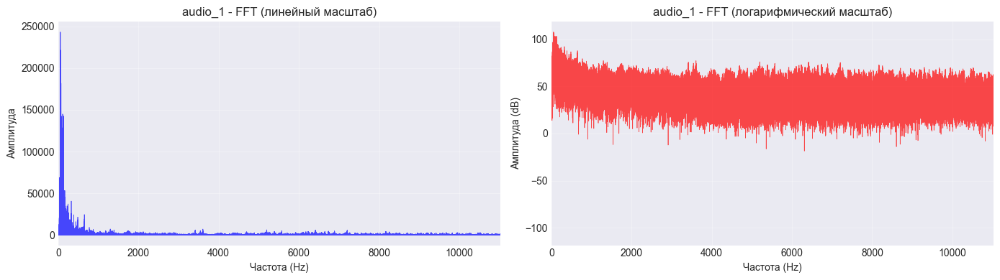


audio_2:
  Максимальная амплитуда в частотной области: 8743.9326
  Доминирующие частоты:
    1. 407.5 Hz (амплитуда: 7708.3955)
    2. 414.7 Hz (амплитуда: 7985.2964)
    3. 333.6 Hz (амплитуда: 8031.9370)
    4. 374.1 Hz (амплитуда: 8465.4199)
    5. 383.4 Hz (амплитуда: 8743.9326)


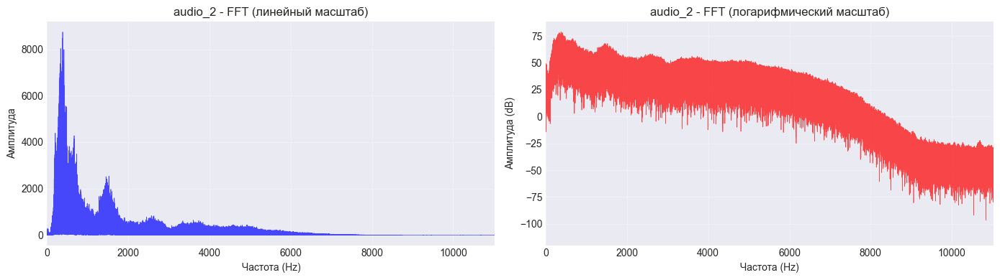


audio_3:
  Максимальная амплитуда в частотной области: 5323.0459
  Доминирующие частоты:
    1. 100.1 Hz (амплитуда: 4631.9858)
    2. 47.9 Hz (амплитуда: 4652.9771)
    3. 47.9 Hz (амплитуда: 4780.5762)
    4. 47.9 Hz (амплитуда: 5132.3970)
    5. 47.9 Hz (амплитуда: 5323.0459)


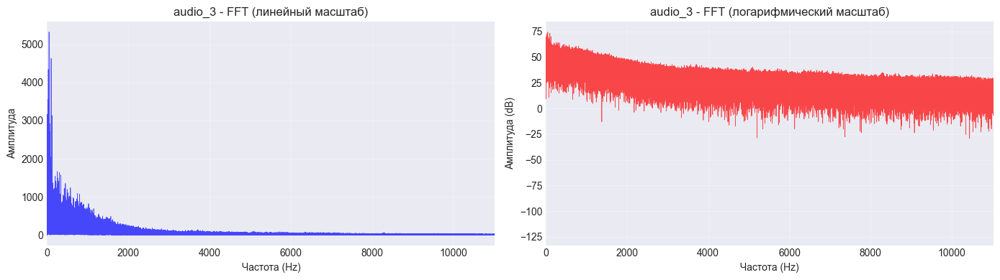


audio_4:
  Максимальная амплитуда в частотной области: 2086.6899
  Доминирующие частоты:
    1. 183.5 Hz (амплитуда: 1843.5040)
    2. 162.6 Hz (амплитуда: 1927.0371)
    3. 156.1 Hz (амплитуда: 1938.9082)
    4. 162.5 Hz (амплитуда: 2007.2792)
    5. 183.5 Hz (амплитуда: 2086.6899)


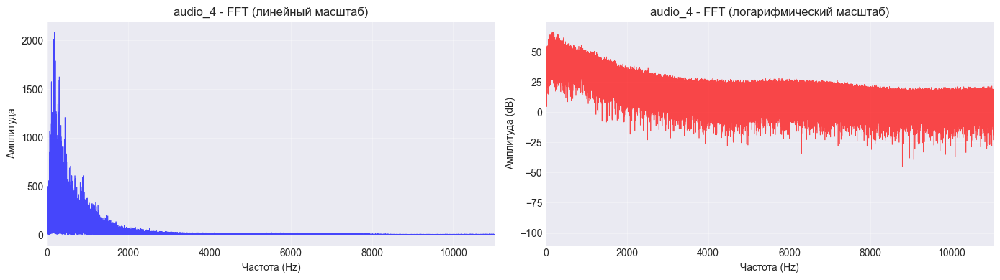


audio_5:
  Максимальная амплитуда в частотной области: 55.4786
  Доминирующие частоты:
    1. 131.2 Hz (амплитуда: 41.6343)
    2. 130.7 Hz (амплитуда: 41.7050)
    3. 131.2 Hz (амплитуда: 47.2135)
    4. 131.2 Hz (амплитуда: 53.8431)
    5. 131.2 Hz (амплитуда: 55.4786)


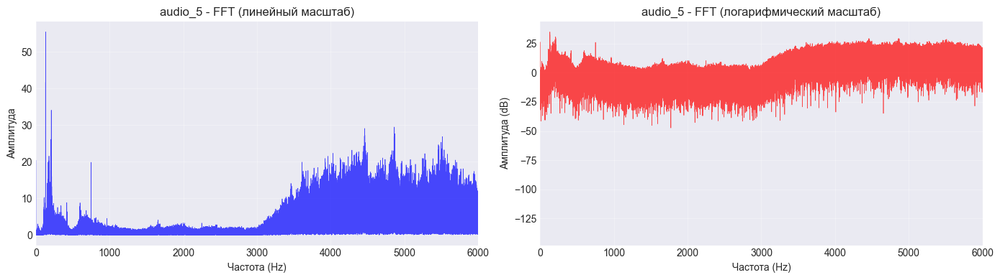

In [9]:
print("FFT АНАЛИЗ")
print("="*80)

for key in loaded_audio.keys():
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    n = len(y)
    Y = np.fft.fft(y)
    Y_mag = np.abs(Y[:n//2])
    freq = np.fft.fftfreq(n, 1/sr)[:n//2]

    top_n = 5
    idx_sorted = np.argsort(Y_mag)[-top_n:]
    dominant_freqs = freq[idx_sorted]
    dominant_mags = Y_mag[idx_sorted]

    print(f"\n{key}:")
    print(f"  Максимальная амплитуда в частотной области: {np.max(Y_mag):.4f}")
    print(f"  Доминирующие частоты:")
    for i, (f, mag) in enumerate(zip(dominant_freqs, dominant_mags)):
        print(f"    {i+1}. {f:.1f} Hz (амплитуда: {mag:.4f})")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))

    ax1.plot(freq, Y_mag, color='blue', alpha=0.7, linewidth=0.5)
    ax1.set_title(f'{key} - FFT (линейный масштаб)')
    ax1.set_xlabel('Частота (Hz)')
    ax1.set_ylabel('Амплитуда')
    ax1.set_xlim([0, sr/4])
    ax1.grid(True, alpha=0.3)

    ax2.plot(freq, 20*np.log10(Y_mag + 1e-10), color='red', alpha=0.7, linewidth=0.5)
    ax2.set_title(f'{key} - FFT (логарифмический масштаб)')
    ax2.set_xlabel('Частота (Hz)')
    ax2.set_ylabel('Амплитуда (dB)')
    ax2.set_xlim([0, sr/4])
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

STFT И СПЕКТРОГРАММА МОЩНОСТИ

audio_1:


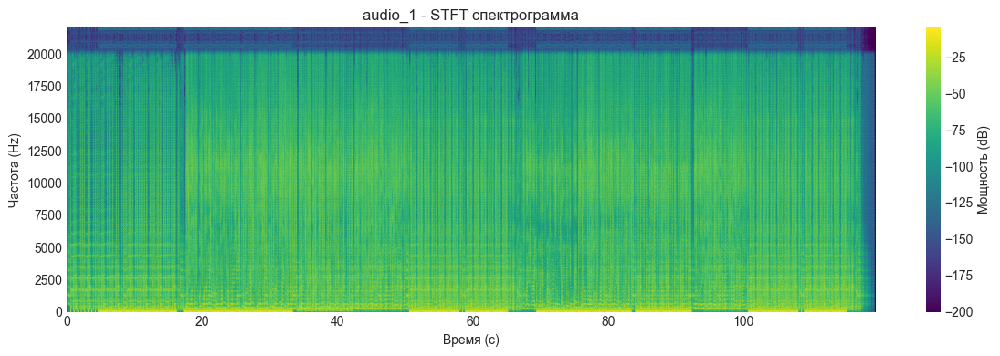

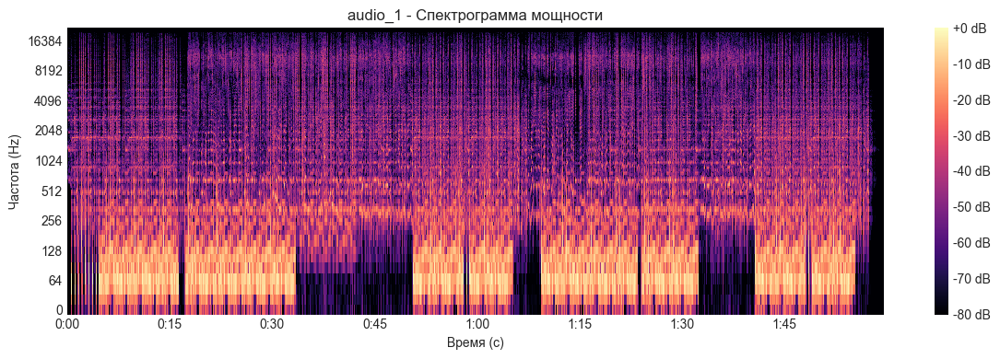

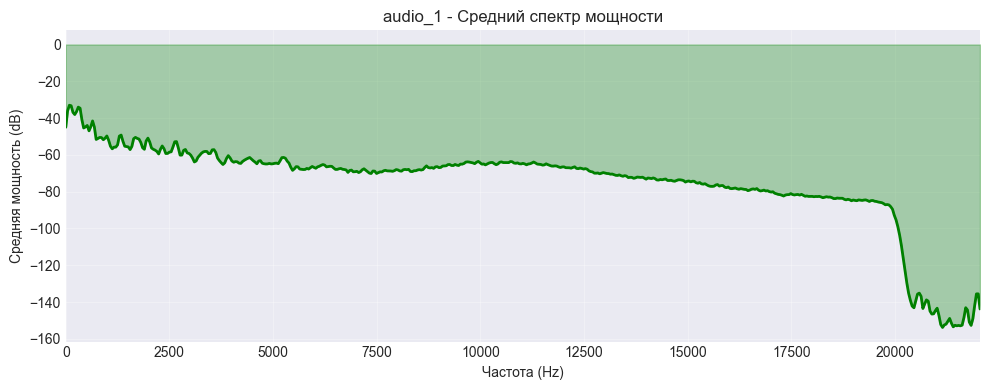

------------------------------------------------------------

audio_2:


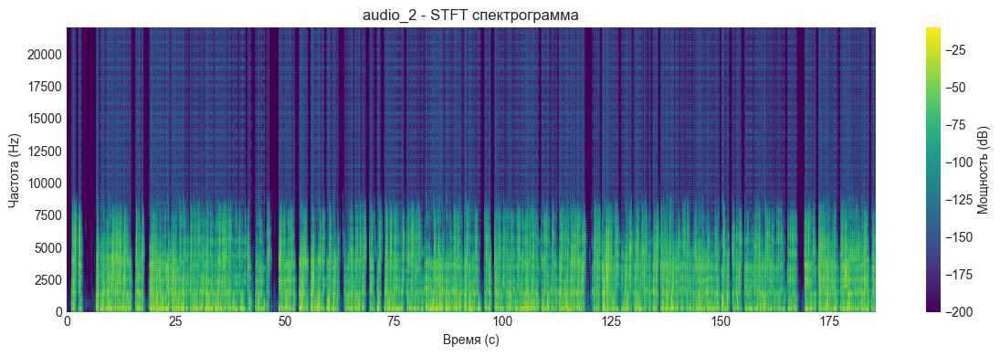

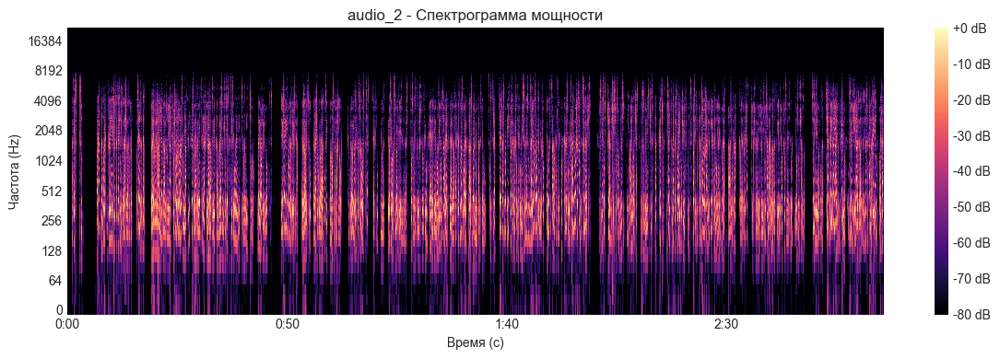

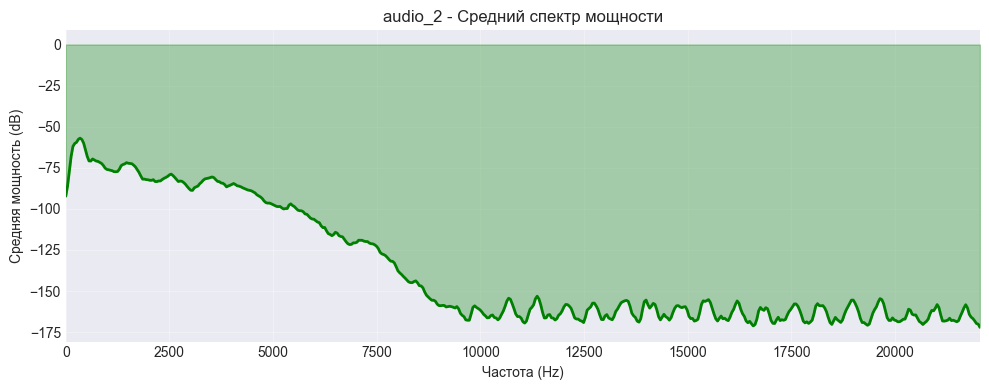

------------------------------------------------------------

audio_3:


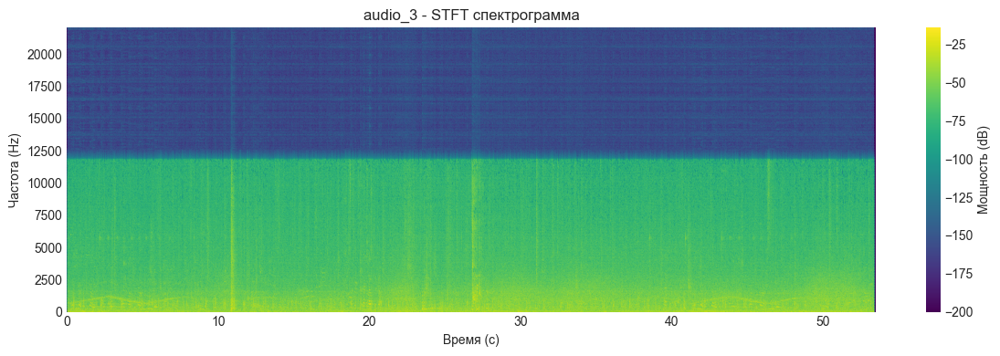

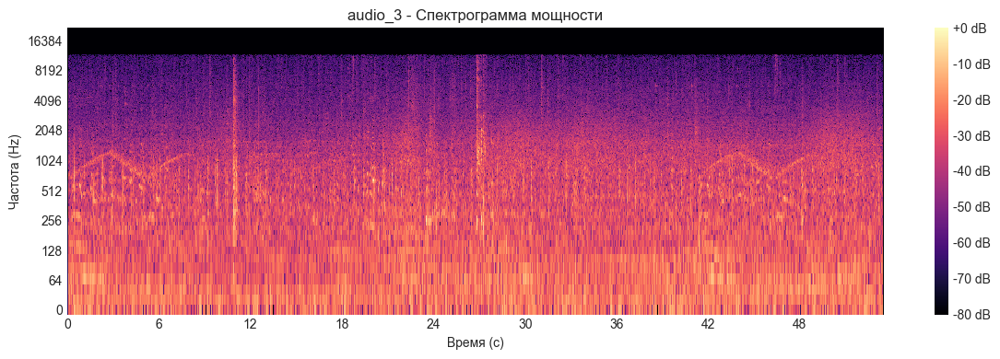

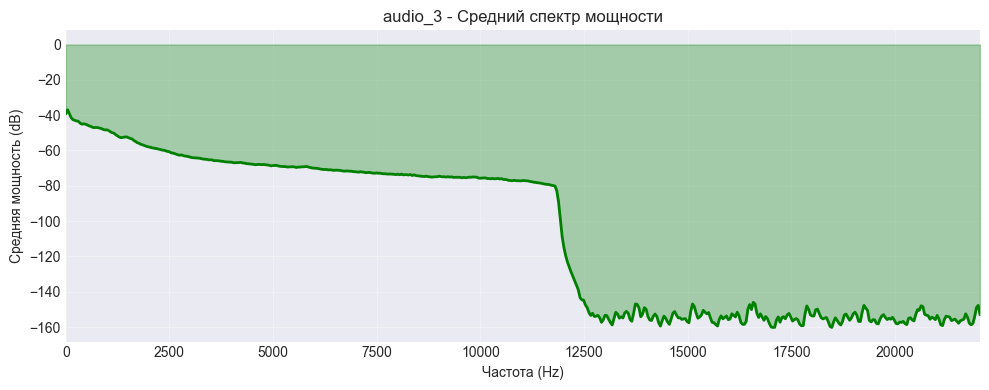

------------------------------------------------------------

audio_4:


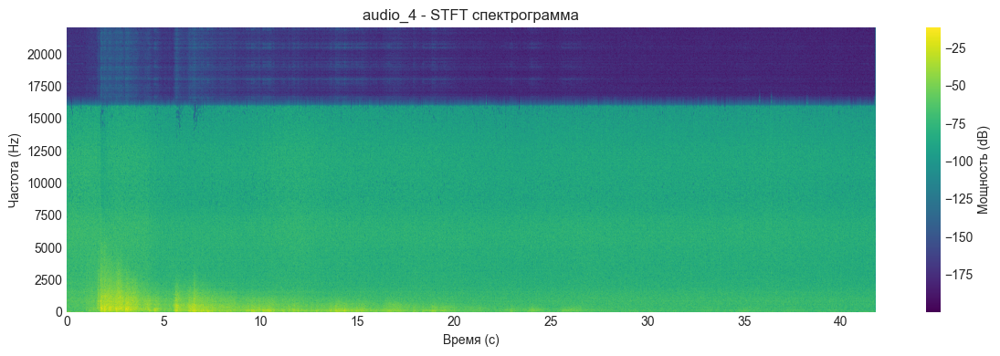

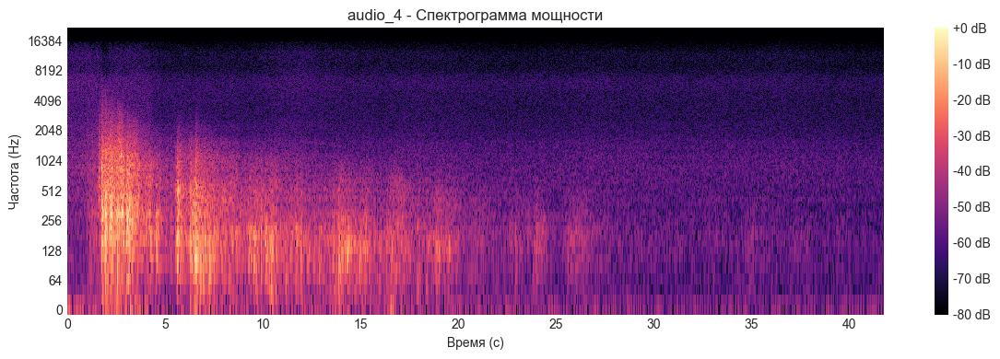

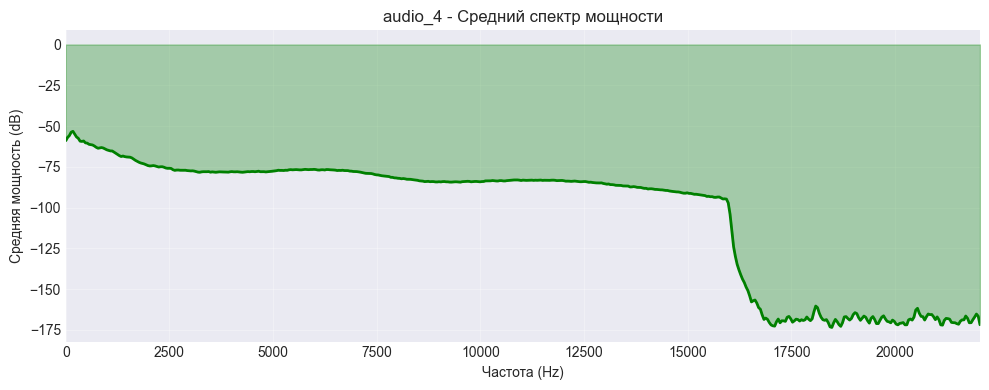

------------------------------------------------------------

audio_5:


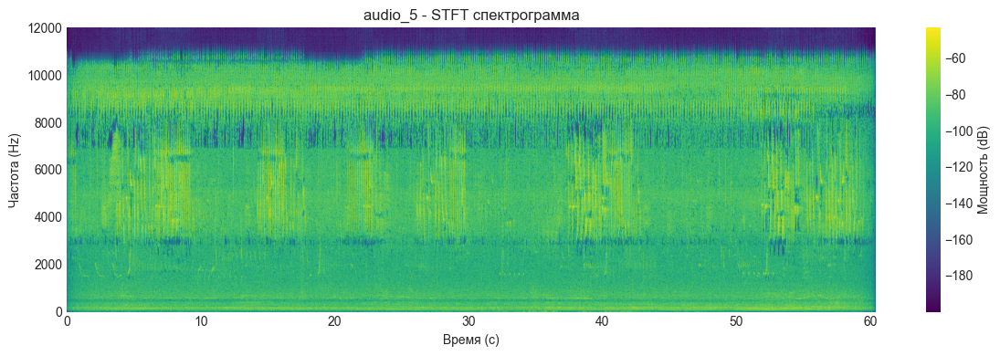

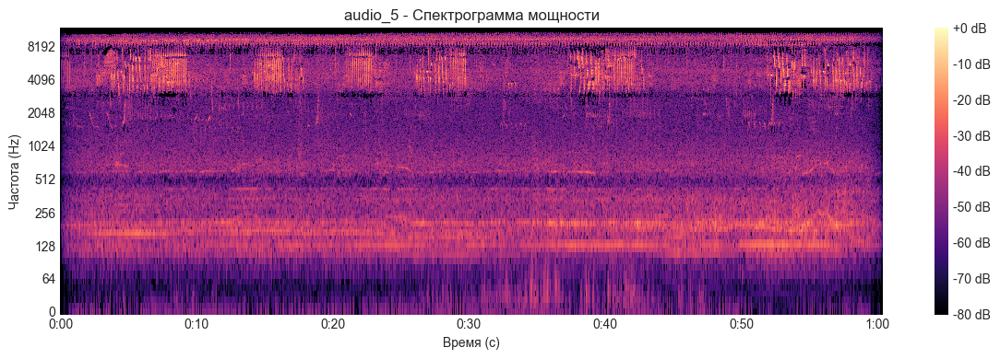

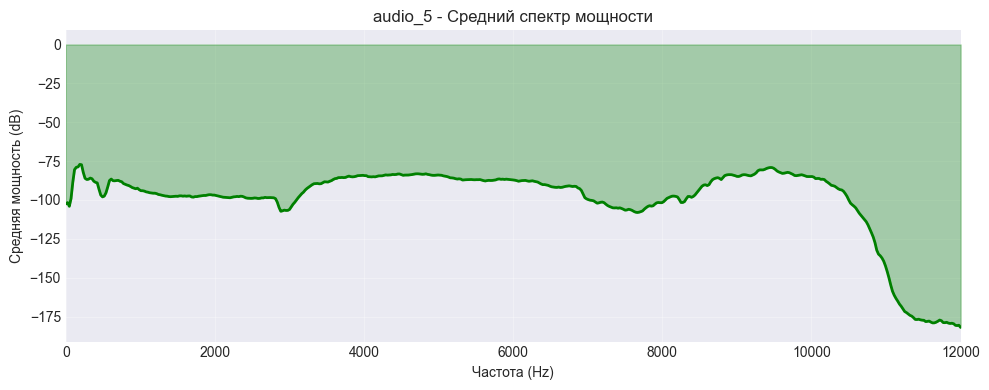

------------------------------------------------------------


In [10]:
print("STFT И СПЕКТРОГРАММА МОЩНОСТИ")
print("="*80)

for key in loaded_audio.keys():
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    print(f"\n{key}:")

    f, t, Zxx = signal.stft(y, sr, nperseg=1024, noverlap=512)

    plt.figure(figsize=(12, 4))
    im1 = plt.pcolormesh(t, f, 20*np.log10(np.abs(Zxx) + 1e-10), shading='gouraud', cmap='viridis')
    plt.title(f'{key} - STFT спектрограмма')
    plt.xlabel('Время (с)')
    plt.ylabel('Частота (Hz)')
    plt.colorbar(im1, label='Мощность (dB)')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 4))
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    im2 = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', cmap='magma')
    plt.title(f'{key} - Спектрограмма мощности')
    plt.xlabel('Время (с)')
    plt.ylabel('Частота (Hz)')
    plt.colorbar(im2, format='%+2.0f dB')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 4))
    mean_power = np.mean(20*np.log10(np.abs(Zxx) + 1e-10), axis=1)
    plt.plot(f, mean_power, color='green', linewidth=2)
    plt.fill_between(f, mean_power, alpha=0.3, color='green')
    plt.title(f'{key} - Средний спектр мощности')
    plt.xlabel('Частота (Hz)')
    plt.ylabel('Средняя мощность (dB)')
    plt.grid(True, alpha=0.3)
    plt.xlim([0, sr/2])
    plt.tight_layout()
    plt.show()

    print("-"*60)

MEL-СПЕКТРОГРАММА

audio_1:


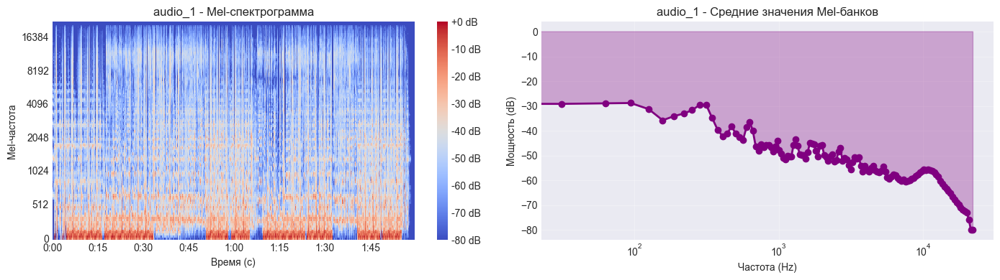


audio_2:


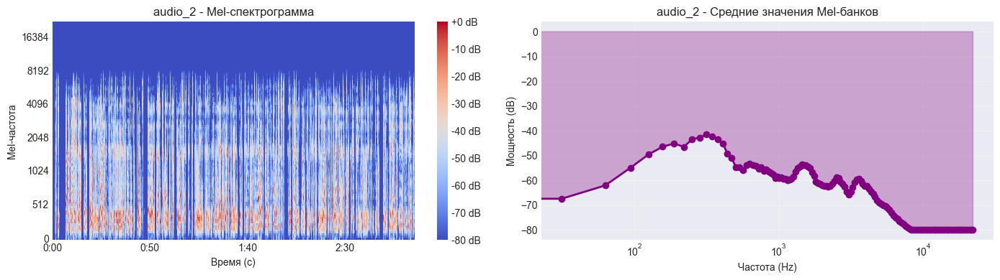


audio_3:


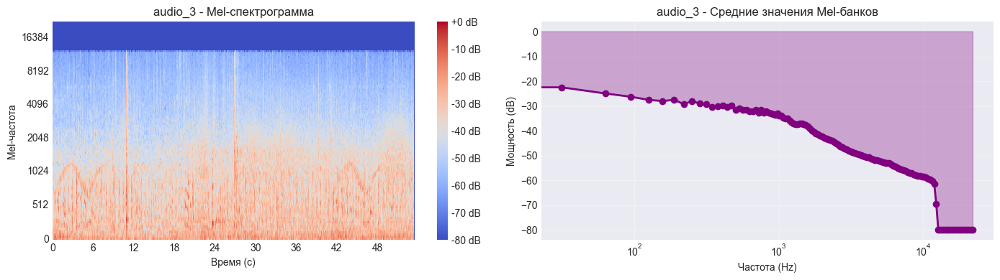


audio_4:


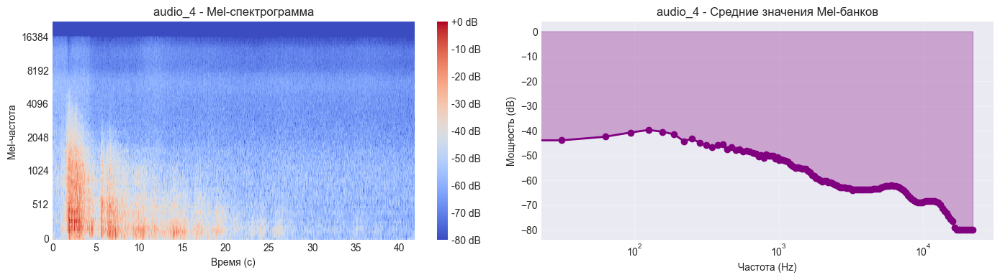


audio_5:


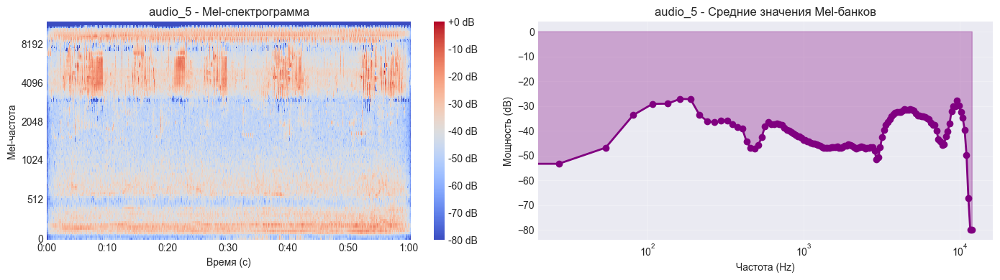

In [11]:
print("MEL-СПЕКТРОГРАММА")
print("="*80)

for key in loaded_audio.keys():
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    print(f"\n{key}:")

    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=sr/2)
    S_dB = librosa.power_to_db(S, ref=np.max)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))

    im1 = librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', ax=ax1, cmap='coolwarm')
    ax1.set_title(f'{key} - Mel-спектрограмма')
    ax1.set_xlabel('Время (с)')
    ax1.set_ylabel('Mel-частота')
    plt.colorbar(im1, ax=ax1, format='%+2.0f dB')

    mean_mel = np.mean(S_dB, axis=1)
    mel_freqs = librosa.mel_frequencies(n_mels=128, fmax=sr/2)

    ax2.plot(mel_freqs, mean_mel, color='purple', linewidth=2, marker='o')
    ax2.fill_between(mel_freqs, mean_mel, alpha=0.3, color='purple')
    ax2.set_title(f'{key} - Средние значения Mel-банков')
    ax2.set_xlabel('Частота (Hz)')
    ax2.set_ylabel('Мощность (dB)')
    ax2.grid(True, alpha=0.3)
    ax2.set_xscale('log')

    plt.tight_layout()
    plt.show()

MFCC (MEL-FREQUENCY CEPSTRAL COEFFICIENTS)

audio_1:


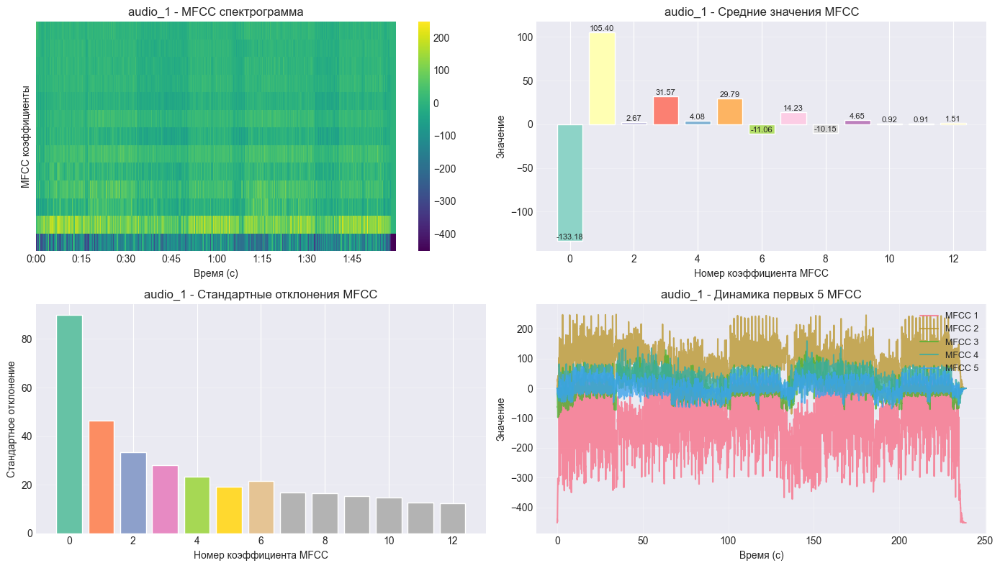

  Средние значения MFCC:
    MFCC 1: -133.1816 ± 89.9164
    MFCC 2: 105.3961 ± 46.5231
    MFCC 3: 2.6682 ± 33.2587
    MFCC 4: 31.5661 ± 28.1529
    MFCC 5: 4.0796 ± 23.2617
    MFCC 6: 29.7922 ± 19.2420
    MFCC 7: -11.0650 ± 21.3610
    MFCC 8: 14.2304 ± 16.6965
    MFCC 9: -10.1542 ± 16.4380
    MFCC 10: 4.6509 ± 15.1733
    MFCC 11: 0.9199 ± 14.7763
    MFCC 12: 0.9062 ± 12.7507
    MFCC 13: 1.5072 ± 12.3068

audio_2:


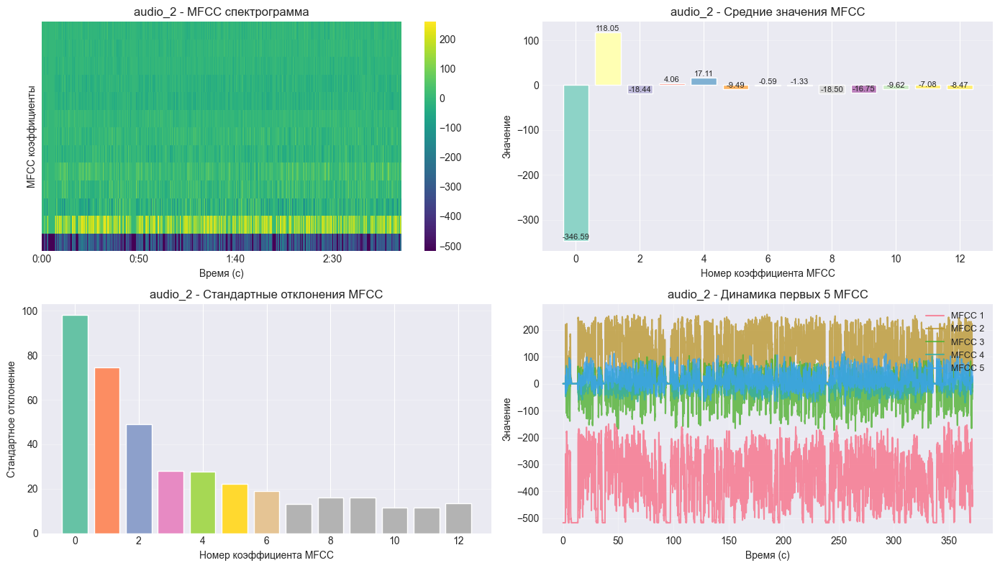

  Средние значения MFCC:
    MFCC 1: -346.5876 ± 98.1775
    MFCC 2: 118.0495 ± 74.6541
    MFCC 3: -18.4389 ± 48.9458
    MFCC 4: 4.0563 ± 28.1270
    MFCC 5: 17.1096 ± 27.5274
    MFCC 6: -9.4875 ± 22.2023
    MFCC 7: -0.5922 ± 19.0591
    MFCC 8: -1.3328 ± 13.2474
    MFCC 9: -18.5032 ± 16.0711
    MFCC 10: -16.7482 ± 16.0518
    MFCC 11: -9.6195 ± 11.6129
    MFCC 12: -7.0781 ± 11.5672
    MFCC 13: -8.4703 ± 13.3961

audio_3:


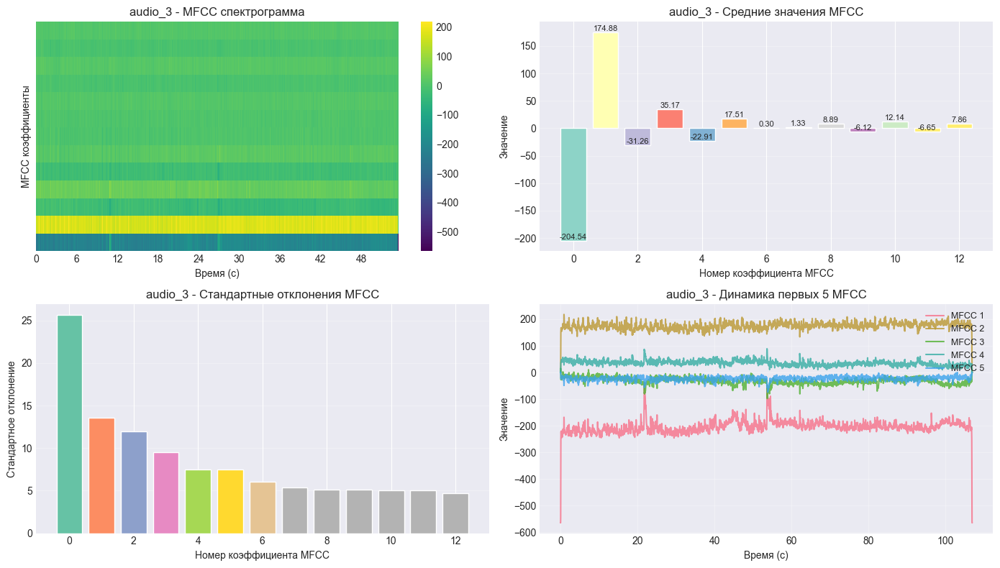

  Средние значения MFCC:
    MFCC 1: -204.5439 ± 25.6465
    MFCC 2: 174.8813 ± 13.5835
    MFCC 3: -31.2563 ± 11.9782
    MFCC 4: 35.1698 ± 9.4751
    MFCC 5: -22.9149 ± 7.5013
    MFCC 6: 17.5103 ± 7.4638
    MFCC 7: 0.2971 ± 6.0286
    MFCC 8: 1.3293 ± 5.3460
    MFCC 9: 8.8857 ± 5.0853
    MFCC 10: -6.1162 ± 5.1126
    MFCC 11: 12.1436 ± 5.0042
    MFCC 12: -6.6458 ± 5.0193
    MFCC 13: 7.8583 ± 4.6772

audio_4:


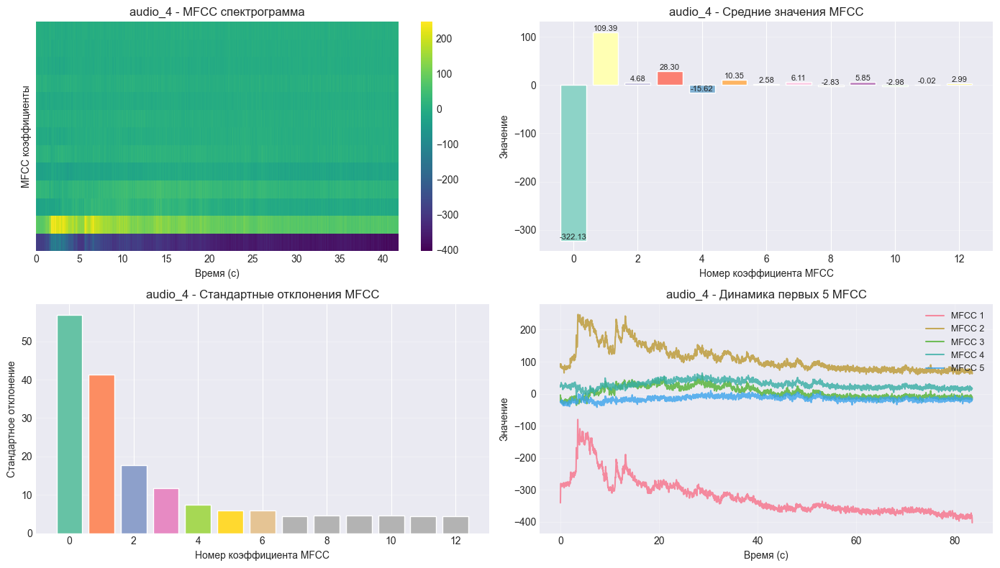

  Средние значения MFCC:
    MFCC 1: -322.1324 ± 56.8777
    MFCC 2: 109.3897 ± 41.2499
    MFCC 3: 4.6775 ± 17.7446
    MFCC 4: 28.2993 ± 11.7686
    MFCC 5: -15.6225 ± 7.4269
    MFCC 6: 10.3487 ± 5.9581
    MFCC 7: 2.5845 ± 5.8659
    MFCC 8: 6.1148 ± 4.4401
    MFCC 9: -2.8259 ± 4.6858
    MFCC 10: 5.8543 ± 4.5355
    MFCC 11: -2.9753 ± 4.5358
    MFCC 12: -0.0151 ± 4.3379
    MFCC 13: 2.9906 ± 4.3726

audio_5:


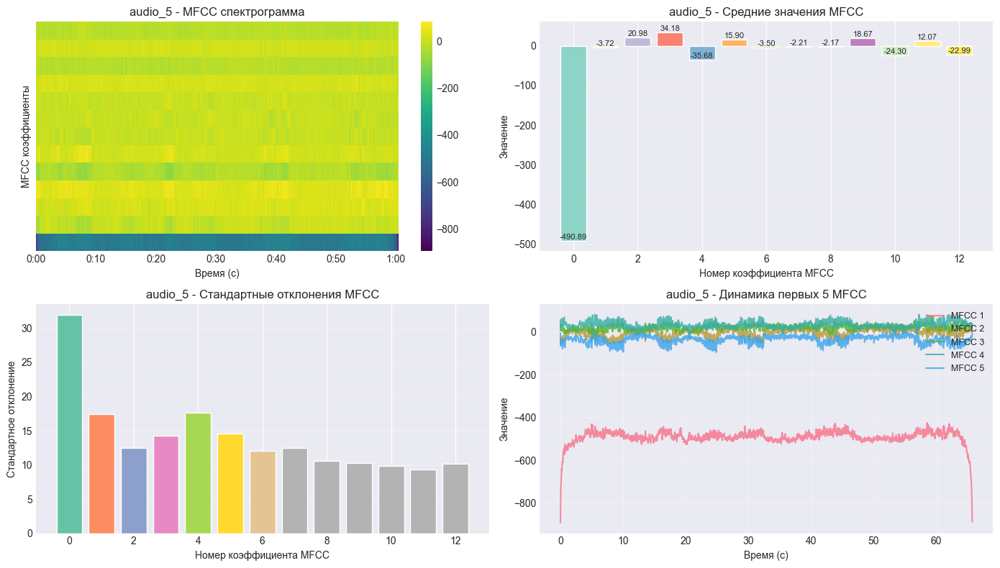

  Средние значения MFCC:
    MFCC 1: -490.8890 ± 31.9407
    MFCC 2: -3.7186 ± 17.3871
    MFCC 3: 20.9777 ± 12.5077
    MFCC 4: 34.1767 ± 14.2761
    MFCC 5: -35.6800 ± 17.6196
    MFCC 6: 15.9044 ± 14.5995
    MFCC 7: -3.4998 ± 12.0546
    MFCC 8: -2.2070 ± 12.4657
    MFCC 9: -2.1665 ± 10.6319
    MFCC 10: 18.6721 ± 10.2406
    MFCC 11: -24.2988 ± 9.8551
    MFCC 12: 12.0745 ± 9.2823
    MFCC 13: -22.9915 ± 10.2011


In [12]:
print("MFCC (MEL-FREQUENCY CEPSTRAL COEFFICIENTS)")
print("="*80)

all_mfccs = {}
for key in loaded_audio.keys():
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    print(f"\n{key}:")

    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    all_mfccs[key] = mfccs

    fig, axes = plt.subplots(2, 2, figsize=(14, 8))

    im1 = librosa.display.specshow(mfccs, sr=sr, x_axis='time', ax=axes[0, 0], cmap='viridis')
    axes[0, 0].set_title(f'{key} - MFCC спектрограмма')
    axes[0, 0].set_xlabel('Время (с)')
    axes[0, 0].set_ylabel('MFCC коэффициенты')
    plt.colorbar(im1, ax=axes[0, 0])

    mfccs_mean = np.mean(mfccs, axis=1)
    bars = axes[0, 1].bar(range(len(mfccs_mean)), mfccs_mean,
                         color=plt.cm.Set3(range(len(mfccs_mean))))
    axes[0, 1].set_title(f'{key} - Средние значения MFCC')
    axes[0, 1].set_xlabel('Номер коэффициента MFCC')
    axes[0, 1].set_ylabel('Значение')
    axes[0, 1].grid(True, alpha=0.3, axis='y')

    for bar, val in zip(bars, mfccs_mean):
        height = bar.get_height()
        axes[0, 1].text(bar.get_x() + bar.get_width()/2., height,
                       f'{val:.2f}', ha='center', va='bottom', fontsize=8)

    mfccs_std = np.std(mfccs, axis=1)
    axes[1, 0].bar(range(len(mfccs_std)), mfccs_std, color=plt.cm.Set2(range(len(mfccs_std))))
    axes[1, 0].set_title(f'{key} - Стандартные отклонения MFCC')
    axes[1, 0].set_xlabel('Номер коэффициента MFCC')
    axes[1, 0].set_ylabel('Стандартное отклонение')
    axes[1, 0].grid(True, alpha=0.3, axis='y')

    time_mfcc = librosa.times_like(mfccs)
    for i in range(min(5, mfccs.shape[0])):
        axes[1, 1].plot(time_mfcc, mfccs[i], label=f'MFCC {i+1}', linewidth=1.5, alpha=0.8)
    axes[1, 1].set_title(f'{key} - Динамика первых 5 MFCC')
    axes[1, 1].set_xlabel('Время (с)')
    axes[1, 1].set_ylabel('Значение')
    axes[1, 1].legend(loc='upper right', fontsize=9)
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"  Средние значения MFCC:")
    for i, mean_val in enumerate(mfccs_mean):
        print(f"    MFCC {i+1}: {mean_val:.4f} ± {mfccs_std[i]:.4f}")

АНАЛИЗ ШУМОВ

audio_1:
  SNR (отношение сигнал/шум): 15.59 dB
  PSNR (пик-сигнал/шум): 8.50 dB
  Мощность сигнала (<2000Hz): 2.04e+12
  Мощность шума (>2000Hz): 5.63e+10


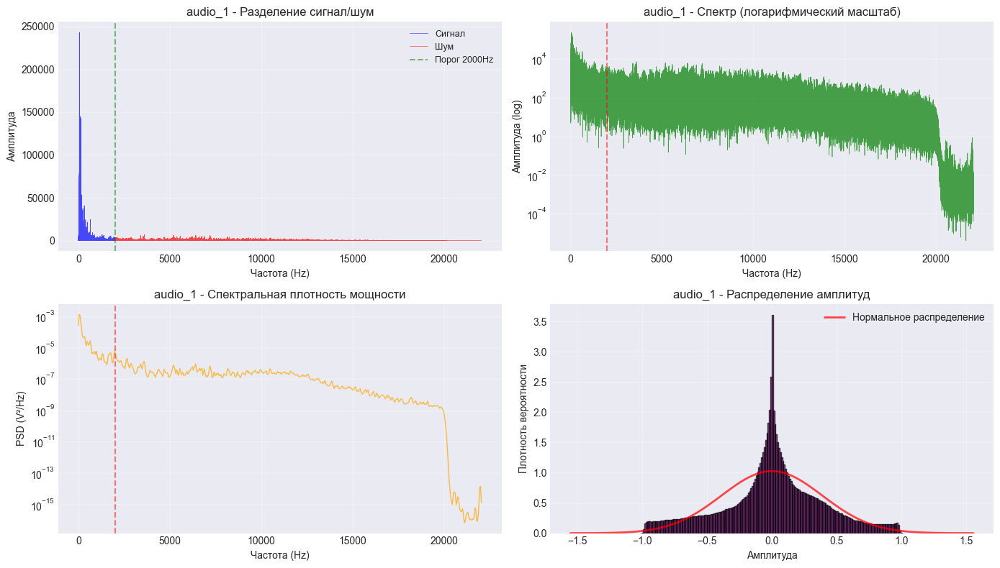


audio_2:
  SNR (отношение сигнал/шум): 13.52 dB
  PSNR (пик-сигнал/шум): 15.75 dB
  Мощность сигнала (<2000Hz): 3.91e+11
  Мощность шума (>2000Hz): 1.74e+10


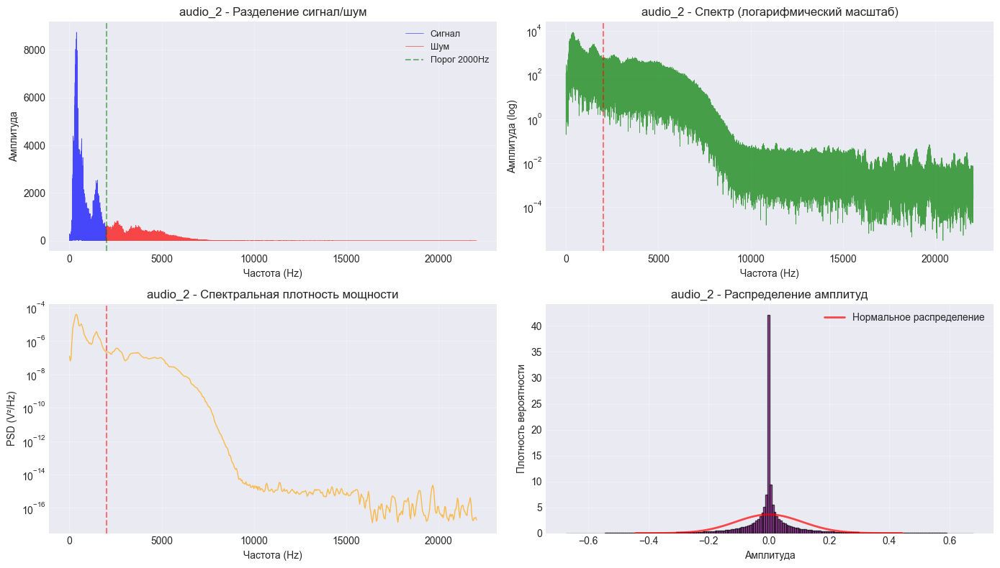


audio_3:
  SNR (отношение сигнал/шум): 13.79 dB
  PSNR (пик-сигнал/шум): 23.11 dB
  Мощность сигнала (<2000Hz): 1.15e+10
  Мощность шума (>2000Hz): 4.78e+08


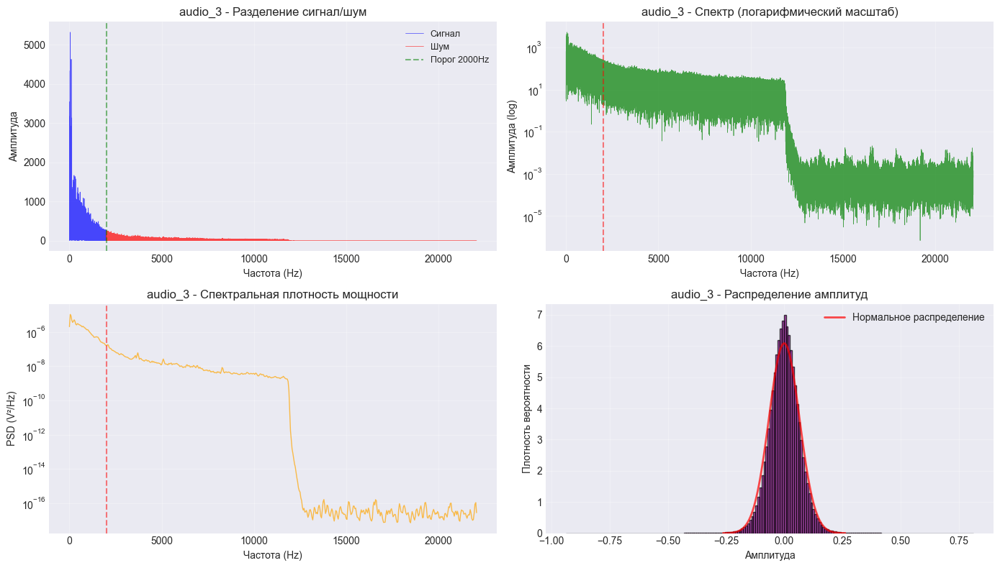


audio_4:
  SNR (отношение сигнал/шум): 21.79 dB
  PSNR (пик-сигнал/шум): 25.46 dB
  Мощность сигнала (<2000Hz): 5.15e+09
  Мощность шума (>2000Hz): 3.41e+07


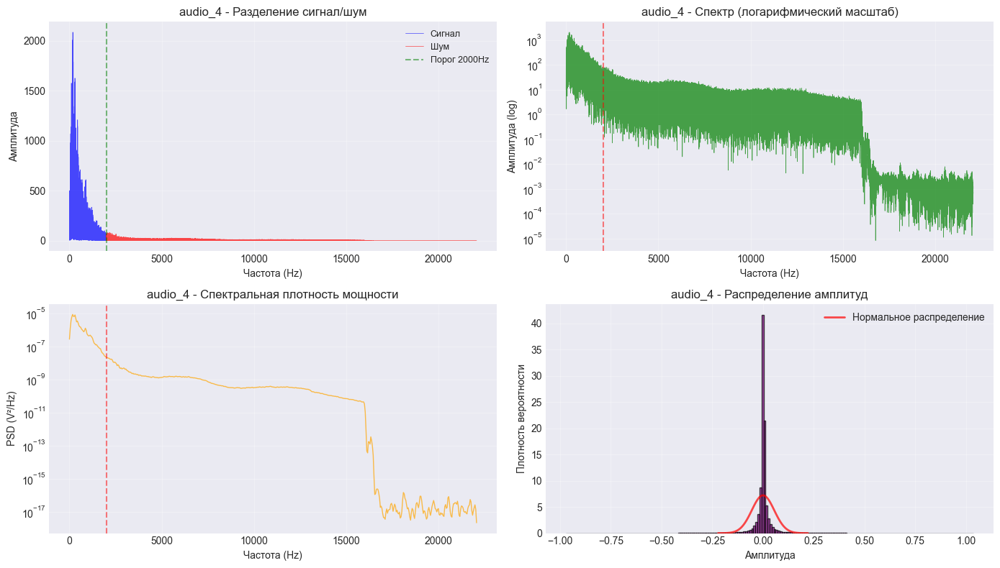


audio_5:
  SNR (отношение сигнал/шум): -14.75 dB
  PSNR (пик-сигнал/шум): 19.44 dB
  Мощность сигнала (<2000Hz): 4.29e+05
  Мощность шума (>2000Hz): 1.28e+07


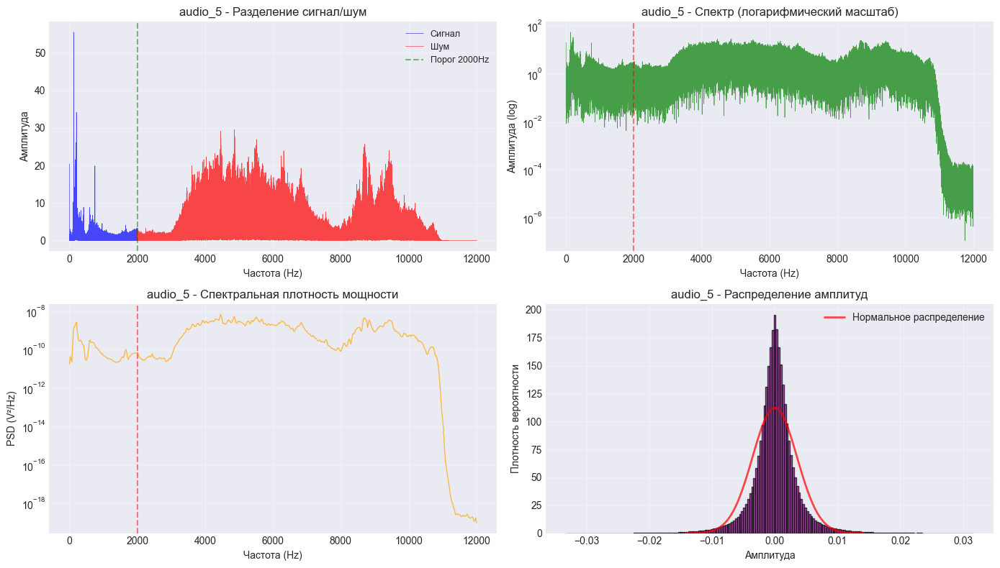

In [13]:
print("АНАЛИЗ ШУМОВ")
print("="*80)

for key in loaded_audio.keys():
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    print(f"\n{key}:")

    n = len(y)
    Y = np.fft.fft(y)
    Y_mag = np.abs(Y[:n//2])
    freq = np.fft.fftfreq(n, 1/sr)[:n//2]

    noise_threshold = 2000
    signal_mask = freq <= noise_threshold
    noise_mask = freq > noise_threshold

    signal_power = np.sum(Y_mag[signal_mask]**2) if np.any(signal_mask) else 0
    noise_power = np.sum(Y_mag[noise_mask]**2) if np.any(noise_mask) else 0

    if noise_power > 0:
        snr_db = 10 * np.log10(signal_power / noise_power)
    else:
        snr_db = float('inf')

    peak_signal = np.max(np.abs(y))
    rms_noise = np.sqrt(np.mean(y[::10]**2))

    if rms_noise > 0:
        psnr_db = 20 * np.log10(peak_signal / rms_noise)
    else:
        psnr_db = float('inf')

    print(f"  SNR (отношение сигнал/шум): {snr_db:.2f} dB")
    print(f"  PSNR (пик-сигнал/шум): {psnr_db:.2f} dB")
    print(f"  Мощность сигнала (<{noise_threshold}Hz): {signal_power:.2e}")
    print(f"  Мощность шума (>{noise_threshold}Hz): {noise_power:.2e}")

    fig, axes = plt.subplots(2, 2, figsize=(14, 8))

    axes[0, 0].plot(freq[signal_mask], Y_mag[signal_mask], 'b-', alpha=0.7, linewidth=0.5, label='Сигнал')
    axes[0, 0].plot(freq[noise_mask], Y_mag[noise_mask], 'r-', alpha=0.7, linewidth=0.5, label='Шум')
    axes[0, 0].axvline(x=noise_threshold, color='green', linestyle='--', alpha=0.5, label=f'Порог {noise_threshold}Hz')
    axes[0, 0].set_title(f'{key} - Разделение сигнал/шум')
    axes[0, 0].set_xlabel('Частота (Hz)')
    axes[0, 0].set_ylabel('Амплитуда')
    axes[0, 0].legend(fontsize=9)
    axes[0, 0].grid(True, alpha=0.3)

    axes[0, 1].semilogy(freq, Y_mag + 1e-10, 'g-', alpha=0.7, linewidth=0.5)
    axes[0, 1].axvline(x=noise_threshold, color='red', linestyle='--', alpha=0.5)
    axes[0, 1].set_title(f'{key} - Спектр (логарифмический масштаб)')
    axes[0, 1].set_xlabel('Частота (Hz)')
    axes[0, 1].set_ylabel('Амплитуда (log)')
    axes[0, 1].grid(True, alpha=0.3)

    f_psd, Pxx = signal.welch(y, sr, nperseg=1024)
    axes[1, 0].semilogy(f_psd, Pxx, 'orange', alpha=0.7, linewidth=1)
    axes[1, 0].axvline(x=noise_threshold, color='red', linestyle='--', alpha=0.5)
    axes[1, 0].set_title(f'{key} - Спектральная плотность мощности')
    axes[1, 0].set_xlabel('Частота (Hz)')
    axes[1, 0].set_ylabel('PSD (V²/Hz)')
    axes[1, 0].grid(True, alpha=0.3)

    axes[1, 1].hist(y, bins=200, density=True, alpha=0.7, color='purple', edgecolor='black')
    axes[1, 1].set_title(f'{key} - Распределение амплитуд')
    axes[1, 1].set_xlabel('Амплитуда')
    axes[1, 1].set_ylabel('Плотность вероятности')
    axes[1, 1].grid(True, alpha=0.3)

    mu, sigma = np.mean(y), np.std(y)
    x = np.linspace(mu - 4*sigma, mu + 4*sigma, 100)
    from scipy.stats import norm
    axes[1, 1].plot(x, norm.pdf(x, mu, sigma), 'r-', linewidth=2, alpha=0.7, label='Нормальное распределение')
    axes[1, 1].legend()

    plt.tight_layout()
    plt.show()

СРАВНИТЕЛЬНЫЙ АНАЛИЗ ВСЕХ ФАЙЛОВ


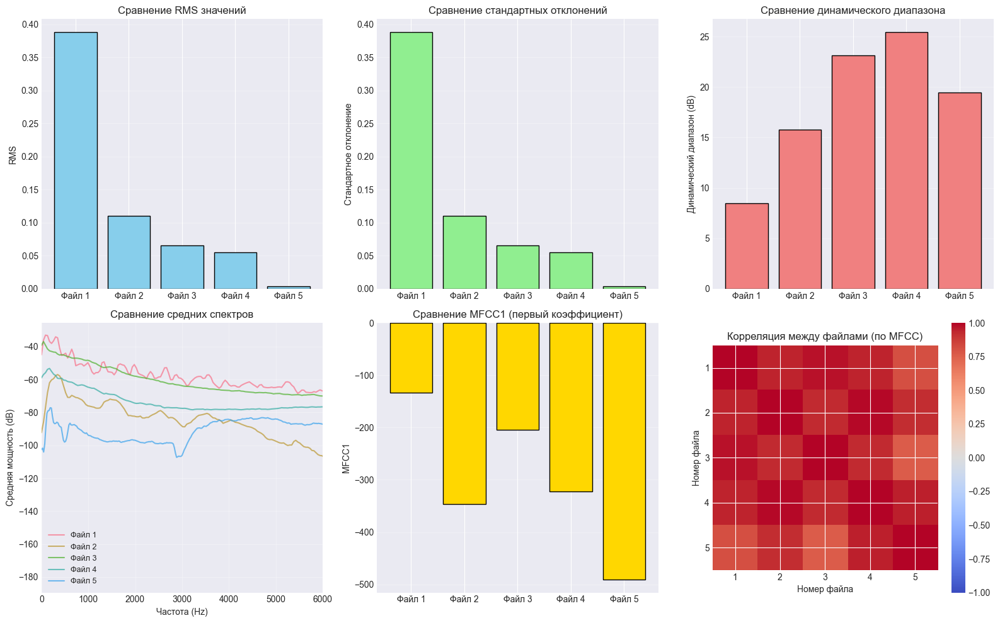


СВОДНАЯ ТАБЛИЦА:
--------------------------------------------------------------------------------
Файл            Длит.(с)   Частота(Hz)  RMS        SNR(dB)   
--------------------------------------------------------------------------------
audio_1         119.51     44100        0.3887     15.59     
audio_2         185.63     44100        0.1104     13.52     
audio_3         53.47      44100        0.0655     13.79     
audio_4         41.77      44100        0.0553     21.79     
audio_5         60.38      24000        0.0036     -14.75    


In [14]:
print("СРАВНИТЕЛЬНЫЙ АНАЛИЗ ВСЕХ ФАЙЛОВ")
print("="*80)

if len(loaded_audio) > 1:
    keys = list(loaded_audio.keys())
    n_files = len(keys)

    fig, axes = plt.subplots(2, 3, figsize=(16, 10))

    # RMS сравнение
    rms_values = [np.sqrt(np.mean(loaded_audio[key]['signal']**2)) for key in keys]
    axes[0, 0].bar(range(n_files), rms_values, color='skyblue', edgecolor='black')
    axes[0, 0].set_title('Сравнение RMS значений')
    axes[0, 0].set_ylabel('RMS')
    axes[0, 0].set_xticks(range(n_files))
    axes[0, 0].set_xticklabels([f"Файл {i+1}" for i in range(n_files)])
    axes[0, 0].grid(True, alpha=0.3, axis='y')

    # Стандартное отклонение
    std_values = [np.std(loaded_audio[key]['signal']) for key in keys]
    axes[0, 1].bar(range(n_files), std_values, color='lightgreen', edgecolor='black')
    axes[0, 1].set_title('Сравнение стандартных отклонений')
    axes[0, 1].set_ylabel('Стандартное отклонение')
    axes[0, 1].set_xticks(range(n_files))
    axes[0, 1].set_xticklabels([f"Файл {i+1}" for i in range(n_files)])
    axes[0, 1].grid(True, alpha=0.3, axis='y')

    # Динамический диапазон
    dyn_range = [20*np.log10(np.max(np.abs(loaded_audio[key]['signal']))/(np.std(loaded_audio[key]['signal'])+1e-10)) for key in keys]
    axes[0, 2].bar(range(n_files), dyn_range, color='lightcoral', edgecolor='black')
    axes[0, 2].set_title('Сравнение динамического диапазона')
    axes[0, 2].set_ylabel('Динамический диапазон (dB)')
    axes[0, 2].set_xticks(range(n_files))
    axes[0, 2].set_xticklabels([f"Файл {i+1}" for i in range(n_files)])
    axes[0, 2].grid(True, alpha=0.3, axis='y')

    # 2. Сравнение средних спектров
    axes[1, 0].set_title('Сравнение средних спектров')
    for i, key in enumerate(keys):
        y = loaded_audio[key]['signal']
        sr = loaded_audio[key]['sr']

        f, t, Zxx = signal.stft(y, sr, nperseg=1024)
        mean_spectrum = np.mean(20*np.log10(np.abs(Zxx) + 1e-10), axis=1)

        axes[1, 0].plot(f[:len(mean_spectrum)], mean_spectrum, label=f'Файл {i+1}',
                       alpha=0.7, linewidth=1.5)

    axes[1, 0].set_xlabel('Частота (Hz)')
    axes[1, 0].set_ylabel('Средняя мощность (dB)')
    axes[1, 0].legend(fontsize=9)
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].set_xlim([0, sr/4])

    # 3. Сравнение средних MFCC (первый коэффициент)
    if 'all_mfccs' in locals():
        mfcc1_values = [np.mean(all_mfccs[key][0]) for key in keys if key in all_mfccs]
        axes[1, 1].bar(range(len(mfcc1_values)), mfcc1_values, color='gold', edgecolor='black')
        axes[1, 1].set_title('Сравнение MFCC1 (первый коэффициент)')
        axes[1, 1].set_ylabel('MFCC1')
        axes[1, 1].set_xticks(range(len(mfcc1_values)))
        axes[1, 1].set_xticklabels([f"Файл {i+1}" for i in range(len(mfcc1_values))])
        axes[1, 1].grid(True, alpha=0.3, axis='y')

    # 4. Матрица корреляции между файлами по MFCC
    if 'all_mfccs' in locals():
        mfcc_means = []
        for key in keys:
            if key in all_mfccs:
                mfcc_means.append(np.mean(all_mfccs[key], axis=1))

        if len(mfcc_means) > 1:
            corr_matrix = np.corrcoef(mfcc_means)
            im = axes[1, 2].imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
            axes[1, 2].set_title('Корреляция между файлами (по MFCC)')
            axes[1, 2].set_xlabel('Номер файла')
            axes[1, 2].set_ylabel('Номер файла')
            axes[1, 2].set_xticks(range(len(mfcc_means)))
            axes[1, 2].set_yticks(range(len(mfcc_means)))
            axes[1, 2].set_xticklabels([f"{i+1}" for i in range(len(mfcc_means))])
            axes[1, 2].set_yticklabels([f"{i+1}" for i in range(len(mfcc_means))])
            plt.colorbar(im, ax=axes[1, 2])

    plt.tight_layout()
    plt.show()

    print("\nСВОДНАЯ ТАБЛИЦА:")
    print("-"*80)
    print(f"{'Файл':<15} {'Длит.(с)':<10} {'Частота(Hz)':<12} {'RMS':<10} {'SNR(dB)':<10}")
    print("-"*80)

    for i, key in enumerate(keys):
        y = loaded_audio[key]['signal']
        sr = loaded_audio[key]['sr']
        duration = len(y)/sr
        rms = np.sqrt(np.mean(y**2))

        # Расчет SNR
        n = len(y)
        Y = np.fft.fft(y)
        Y_mag = np.abs(Y[:n//2])
        freq = np.fft.fftfreq(n, 1/sr)[:n//2]

        noise_threshold = 2000
        signal_mask = freq <= noise_threshold
        noise_mask = freq > noise_threshold

        signal_power = np.sum(Y_mag[signal_mask]**2) if np.any(signal_mask) else 0
        noise_power = np.sum(Y_mag[noise_mask]**2) if np.any(noise_mask) else 0

        if noise_power > 0:
            snr_db = 10 * np.log10(signal_power / noise_power)
        else:
            snr_db = float('inf')

        print(f"{key:<15} {duration:<10.2f} {sr:<12} {rms:<10.4f} {snr_db:<10.2f}")

else:
    print("Для сравнения необходимо загрузить минимум 2 файла")

БАЗОВАЯ ОЧИСТКА ОТ ШУМОВ
Обработка файла: audio_3


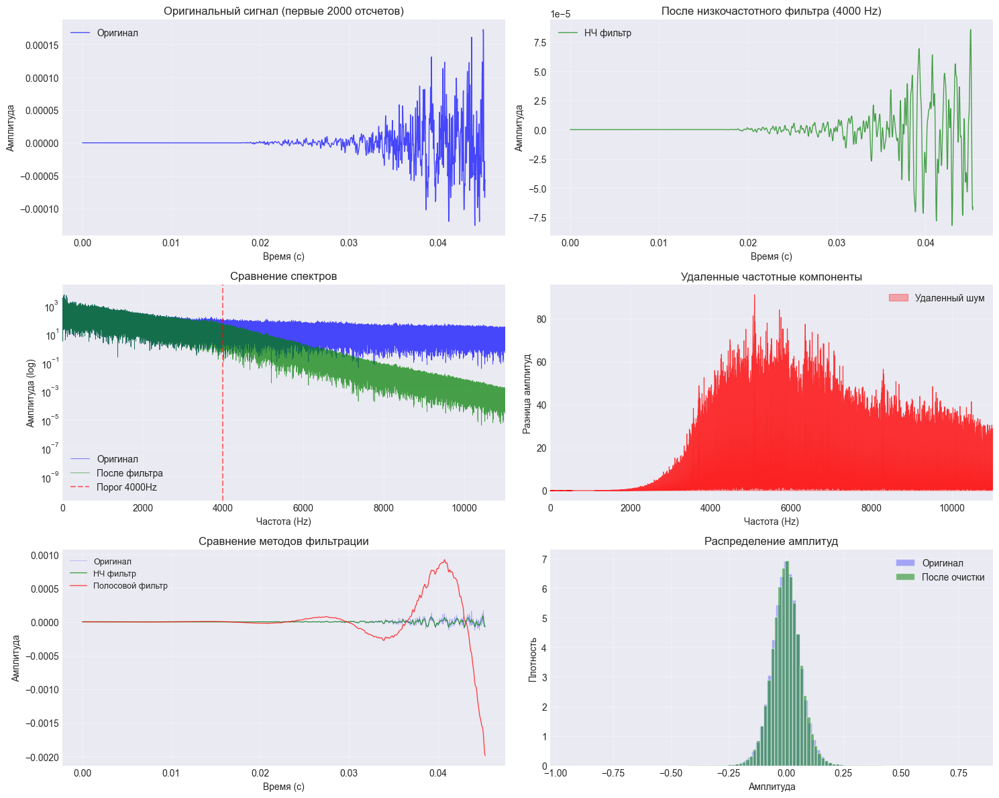


Результаты очистки:
SNR оригинального сигнала: 7.35 dB
SNR после фильтрации: 7.86 dB
Улучшение SNR: 0.52 dB

✓ Очищенные файлы сохранены:
  - audio_3_cleaned_lowpass.wav
  - audio_3_cleaned_bandpass.wav


In [15]:
print("БАЗОВАЯ ОЧИСТКА ОТ ШУМОВ")
print("="*80)

if loaded_audio:
    key = list(loaded_audio.keys())[2]
    y_original = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    print(f"Обработка файла: {key}")

    # 1. Низкочастотный фильтр (удаление высокочастотного шума)
    from scipy.signal import butter, filtfilt

    def butter_lowpass(cutoff, fs, order=5):
        nyquist = 0.5 * fs
        normal_cutoff = cutoff / nyquist
        b, a = butter(order, normal_cutoff, btype='low', analog=False)
        return b, a

    def butter_lowpass_filter(data, cutoff, fs, order=5):
        b, a = butter_lowpass(cutoff, fs, order=order)
        y = filtfilt(b, a, data)
        return y

    # 2. Высокочастотный фильтр (удаление низкочастотного гула)
    def butter_highpass(cutoff, fs, order=5):
        nyquist = 0.5 * fs
        normal_cutoff = cutoff / nyquist
        b, a = butter(order, normal_cutoff, btype='high', analog=False)
        return b, a

    def butter_highpass_filter(data, cutoff, fs, order=5):
        b, a = butter_highpass(cutoff, fs, order=order)
        y = filtfilt(b, a, data)
        return y

    # 3. Полосовой фильтр (оставляем только нужные частоты)
    def butter_bandpass(lowcut, highcut, fs, order=5):
        nyquist = 0.5 * fs
        low = lowcut / nyquist
        high = highcut / nyquist
        b, a = butter(order, [low, high], btype='band')
        return b, a

    def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
        b, a = butter_bandpass(lowcut, highcut, fs, order=order)
        y = filtfilt(b, a, data)
        return y

    # Применяем фильтры
    cutoff_freq = 4000
    y_lowpass = butter_lowpass_filter(y_original, cutoff_freq, sr, order=4)

    # Также убираем низкочастотный гул
    y_bandpass = butter_bandpass_filter(y_original, 80, cutoff_freq, sr, order=4)

    # 4. Медианный фильтр для удаления импульсных шумов
    from scipy.signal import medfilt
    y_median = medfilt(y_original, kernel_size=5)

    # Визуализация результатов
    fig, axes = plt.subplots(3, 2, figsize=(15, 12))

    # Оригинальный сигнал
    time = np.arange(len(y_original)) / sr
    axes[0, 0].plot(time[:2000], y_original[:2000], 'b-', alpha=0.7, linewidth=1, label='Оригинал')
    axes[0, 0].set_title('Оригинальный сигнал (первые 2000 отсчетов)')
    axes[0, 0].set_xlabel('Время (с)')
    axes[0, 0].set_ylabel('Амплитуда')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # После низкочастотного фильтра
    axes[0, 1].plot(time[:2000], y_lowpass[:2000], 'g-', alpha=0.7, linewidth=1, label='НЧ фильтр')
    axes[0, 1].set_title(f'После низкочастотного фильтра ({cutoff_freq} Hz)')
    axes[0, 1].set_xlabel('Время (с)')
    axes[0, 1].set_ylabel('Амплитуда')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Спектры сравнение
    n = len(y_original)
    freq = np.fft.fftfreq(n, 1/sr)[:n//2]

    # Спектр оригинала
    Y_orig = np.fft.fft(y_original)[:n//2]
    Y_orig_mag = np.abs(Y_orig)

    # Спектр после фильтра
    Y_filtered = np.fft.fft(y_lowpass)[:n//2]
    Y_filtered_mag = np.abs(Y_filtered)

    axes[1, 0].semilogy(freq, Y_orig_mag + 1e-10, 'b-', alpha=0.7, linewidth=0.5, label='Оригинал')
    axes[1, 0].semilogy(freq, Y_filtered_mag + 1e-10, 'g-', alpha=0.7, linewidth=0.5, label='После фильтра')
    axes[1, 0].axvline(x=cutoff_freq, color='r', linestyle='--', alpha=0.5, label=f'Порог {cutoff_freq}Hz')
    axes[1, 0].set_title('Сравнение спектров')
    axes[1, 0].set_xlabel('Частота (Hz)')
    axes[1, 0].set_ylabel('Амплитуда (log)')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].set_xlim([0, sr/4])

    # Разница спектров (что было удалено)
    diff_mag = Y_orig_mag - Y_filtered_mag
    axes[1, 1].plot(freq, diff_mag, 'r-', alpha=0.7, linewidth=0.5)
    axes[1, 1].fill_between(freq, 0, diff_mag, where=diff_mag>0, alpha=0.3, color='red', label='Удаленный шум')
    axes[1, 1].set_title('Удаленные частотные компоненты')
    axes[1, 1].set_xlabel('Частота (Hz)')
    axes[1, 1].set_ylabel('Разница амплитуд')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].set_xlim([0, sr/4])

    # Сравнение разных методов
    axes[2, 0].plot(time[:2000], y_original[:2000], 'b-', alpha=0.3, linewidth=0.5, label='Оригинал')
    axes[2, 0].plot(time[:2000], y_lowpass[:2000], 'g-', alpha=0.7, linewidth=1, label='НЧ фильтр')
    axes[2, 0].plot(time[:2000], y_bandpass[:2000], 'r-', alpha=0.7, linewidth=1, label='Полосовой фильтр')
    axes[2, 0].set_title('Сравнение методов фильтрации')
    axes[2, 0].set_xlabel('Время (с)')
    axes[2, 0].set_ylabel('Амплитуда')
    axes[2, 0].legend(fontsize=9)
    axes[2, 0].grid(True, alpha=0.3)

    # Гистограммы амплитуд
    axes[2, 1].hist(y_original, bins=100, density=True, alpha=0.3, color='blue', label='Оригинал')
    axes[2, 1].hist(y_lowpass, bins=100, density=True, alpha=0.5, color='green', label='После очистки')
    axes[2, 1].set_title('Распределение амплитуд')
    axes[2, 1].set_xlabel('Амплитуда')
    axes[2, 1].set_ylabel('Плотность')
    axes[2, 1].legend()
    axes[2, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Расчет улучшения SNR
    def calculate_snr(signal):
        n = len(signal)
        Y = np.fft.fft(signal)
        Y_mag = np.abs(Y[:n//2])
        freq = np.fft.fftfreq(n, 1/sr)[:n//2]

        # Разделение на сигнал и шум
        signal_mask = freq <= 1000
        noise_mask = freq > 1000

        signal_power = np.sum(Y_mag[signal_mask]**2) if np.any(signal_mask) else 0
        noise_power = np.sum(Y_mag[noise_mask]**2) if np.any(noise_mask) else 0

        if noise_power > 0:
            return 10 * np.log10(signal_power / noise_power)
        return float('inf')

    snr_original = calculate_snr(y_original)
    snr_filtered = calculate_snr(y_lowpass)

    print(f"\nРезультаты очистки:")
    print(f"SNR оригинального сигнала: {snr_original:.2f} dB")
    print(f"SNR после фильтрации: {snr_filtered:.2f} dB")
    print(f"Улучшение SNR: {snr_filtered - snr_original:.2f} dB")

    # Сохранение очищенного аудио
    import soundfile as sf
    sf.write(f'{key}_cleaned_lowpass.wav', y_lowpass, sr)
    sf.write(f'{key}_cleaned_bandpass.wav', y_bandpass, sr)
    print(f"\n✓ Очищенные файлы сохранены:")
    print(f"  - {key}_cleaned_lowpass.wav")
    print(f"  - {key}_cleaned_bandpass.wav")

ПРОДВИНУТАЯ ОЧИСТКА - СПЕКТРАЛЬНОЕ ВЫЧИТАНИЕ
Обработка файла: audio_3
Применяем спектральное вычитание...
Применяем фильтр Винера...


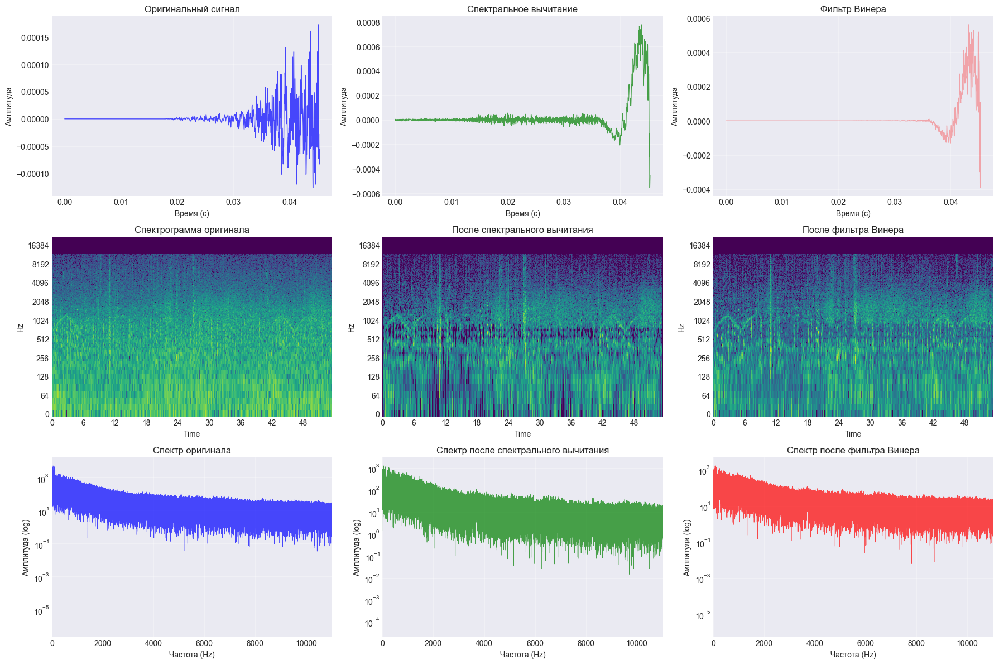


✓ Очищенные файлы сохранены:
  - audio_3_spectral_subtraction.wav
  - audio_3_wiener_filter.wav


In [16]:
print("ПРОДВИНУТАЯ ОЧИСТКА - СПЕКТРАЛЬНОЕ ВЫЧИТАНИЕ")
print("="*80)

if loaded_audio:
    key = list(loaded_audio.keys())[2]
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    print(f"Обработка файла: {key}")

    def spectral_subtraction(audio, sr, n_fft=2048, hop_length=512, noise_reduction_db=20):
        """
        Спектральное вычитание - метод очистки от шумов
        """
        # Вычисляем STFT
        stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
        magnitude, phase = librosa.magphase(stft)

        # Оцениваем шум
        noise_samples = int(0.5 * sr / hop_length)
        noise_estimate = np.mean(magnitude[:, :noise_samples], axis=1, keepdims=True)

        # Вычитаем оценку шума
        magnitude_clean = magnitude - noise_reduction_db/20 * noise_estimate
        magnitude_clean = np.maximum(magnitude_clean, 0.001)  # избегаем отрицательных значений

        # Восстанавливаем сигнал
        stft_clean = magnitude_clean * phase
        audio_clean = librosa.istft(stft_clean, hop_length=hop_length)

        return audio_clean

    def wiener_filter(audio, sr, n_fft=2048, hop_length=512):
        """
        Фильтр Винера для очистки от шумов
        """
        stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
        magnitude, phase = librosa.magphase(stft)

        # Оценка мощности шума
        noise_samples = int(0.5 * sr / hop_length)
        noise_power = np.mean(np.abs(stft[:, :noise_samples])**2, axis=1, keepdims=True)

        # Оценка мощности сигнала
        signal_power = np.abs(stft)**2

        # Коэффициент фильтра Винера
        wiener_gain = (signal_power - noise_power) / signal_power
        wiener_gain = np.maximum(wiener_gain, 0.1)

        # Применение фильтра
        stft_clean = stft * wiener_gain
        audio_clean = librosa.istft(stft_clean, hop_length=hop_length)

        return audio_clean

    print("Применяем спектральное вычитание...")
    y_spectral = spectral_subtraction(y, sr)

    print("Применяем фильтр Винера...")
    y_wiener = wiener_filter(y, sr)

    fig, axes = plt.subplots(3, 3, figsize=(18, 12))

    # Временная область
    time = np.arange(len(y)) / sr
    axes[0, 0].plot(time[:2000], y[:2000], 'b-', alpha=0.7, linewidth=1, label='Оригинал')
    axes[0, 0].set_title('Оригинальный сигнал')
    axes[0, 0].set_xlabel('Время (с)')
    axes[0, 0].set_ylabel('Амплитуда')
    axes[0, 0].grid(True, alpha=0.3)

    axes[0, 1].plot(time[:2000], y_spectral[:2000], 'g-', alpha=0.7, linewidth=1, label='Спектральное вычитание')
    axes[0, 1].set_title('Спектральное вычитание')
    axes[0, 1].set_xlabel('Время (с)')
    axes[0, 1].set_ylabel('Амплитуда')
    axes[0, 1].grid(True, alpha=0.3)

    axes[0, 2].plot(time[:2000], y_wiener[:2000], 'r-', alpha=0.3, linewidth=1, label='Фильтр Винера')
    axes[0, 2].set_title('Фильтр Винера')
    axes[0, 2].set_xlabel('Время (с)')
    axes[0, 2].set_ylabel('Амплитуда')
    axes[0, 2].grid(True, alpha=0.3)

    # Спектрограммы
    # Оригинал
    D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D_orig, sr=sr, x_axis='time', y_axis='log',
                             ax=axes[1, 0], cmap='viridis')
    axes[1, 0].set_title('Спектрограмма оригинала')

    # После спектрального вычитания
    D_spec = librosa.amplitude_to_db(np.abs(librosa.stft(y_spectral)), ref=np.max)
    librosa.display.specshow(D_spec, sr=sr, x_axis='time', y_axis='log',
                             ax=axes[1, 1], cmap='viridis')
    axes[1, 1].set_title('После спектрального вычитания')

    # После фильтра Винера
    D_wien = librosa.amplitude_to_db(np.abs(librosa.stft(y_wiener)), ref=np.max)
    librosa.display.specshow(D_wien, sr=sr, x_axis='time', y_axis='log',
                             ax=axes[1, 2], cmap='viridis')
    axes[1, 2].set_title('После фильтра Винера')

    # Спектры сравнение
    n = len(y)
    freq = np.fft.fftfreq(n, 1/sr)[:n//2]

    Y_orig = np.abs(np.fft.fft(y)[:n//2])
    Y_spec = np.abs(np.fft.fft(y_spectral)[:n//2])
    Y_wien = np.abs(np.fft.fft(y_wiener)[:n//2])

    axes[2, 0].semilogy(freq, Y_orig + 1e-10, 'b-', alpha=0.7, linewidth=0.5)
    axes[2, 0].set_title('Спектр оригинала')
    axes[2, 0].set_xlabel('Частота (Hz)')
    axes[2, 0].set_ylabel('Амплитуда (log)')
    axes[2, 0].grid(True, alpha=0.3)
    axes[2, 0].set_xlim([0, sr/4])

    axes[2, 1].semilogy(freq, Y_spec + 1e-10, 'g-', alpha=0.7, linewidth=0.5)
    axes[2, 1].set_title('Спектр после спектрального вычитания')
    axes[2, 1].set_xlabel('Частота (Hz)')
    axes[2, 1].set_ylabel('Амплитуда (log)')
    axes[2, 1].grid(True, alpha=0.3)
    axes[2, 1].set_xlim([0, sr/4])

    axes[2, 2].semilogy(freq, Y_wien + 1e-10, 'r-', alpha=0.7, linewidth=0.5)
    axes[2, 2].set_title('Спектр после фильтра Винера')
    axes[2, 2].set_xlabel('Частота (Hz)')
    axes[2, 2].set_ylabel('Амплитуда (log)')
    axes[2, 2].grid(True, alpha=0.3)
    axes[2, 2].set_xlim([0, sr/4])

    plt.tight_layout()
    plt.show()

    import soundfile as sf
    sf.write(f'{key}_spectral_subtraction.wav', y_spectral, sr)
    sf.write(f'{key}_wiener_filter.wav', y_wiener, sr)

    print(f"\n✓ Очищенные файлы сохранены:")
    print(f"  - {key}_spectral_subtraction.wav")
    print(f"  - {key}_wiener_filter.wav")

In [22]:
import pywt

def wavelet_packet_decomposition(audio, wavelet='db4', level=5):
    """
    Полное вейвлет-разложение с пакетами
    """
    # Wavelet Packet Transform
    wp = pywt.WaveletPacket(data=audio, wavelet=wavelet, mode='symmetric', maxlevel=level)

    # Получаем все узлы
    nodes = [node.path for node in wp.get_level(level, 'natural')]

    # Коэффициенты для каждого узла
    coefficients = {}
    reconstructions = {}

    for node_path in nodes:
        node = wp[node_path]
        coefficients[node_path] = node.data

        # Реконструкция из этого узла
        wp_reconstruct = pywt.WaveletPacket(data=None, wavelet=wavelet, mode='symmetric')
        wp_reconstruct[node_path] = node.data
        reconstructions[node_path] = wp_reconstruct.reconstruct(update=False)

    return wp, coefficients, reconstructions

def plot_wavelet_spectrogram(audio, sr, dwt_wavelet='db8', cwt_wavelet='cmor1.5-1.0', level=6):
    """
    Вейвлет-анализ: DWT (дискретный) + Scalogram (непрерывный)
    """
    import pywt
    import numpy as np
    import matplotlib.pyplot as plt

    # 1. DWT часть — только дискретный вейвлет
    coeffs = pywt.wavedec(audio, dwt_wavelet, level=level)

    # Визуализация DWT
    fig, axes = plt.subplots(level + 2, 1, figsize=(14, 3*(level+2)), sharex=True)

    time = np.arange(len(audio)) / sr
    axes[0].plot(time, audio, 'b-', alpha=0.7, linewidth=0.5)
    axes[0].set_title('Оригинальный сигнал')
    axes[0].grid(True, alpha=0.3)

    for i in range(level + 1):
        if i == 0:
            # Аппроксимация (самая низкочастотная часть)
            axes[1].plot(coeffs[0], 'g-', alpha=0.7, linewidth=1)
            axes[1].set_title(f'Аппроксимация уровня {i}')
        else:
            # Детали
            axes[i+1].plot(coeffs[i], 'r-', alpha=0.7, linewidth=0.5)
            axes[i+1].set_title(f'Детали уровня {i}')
        axes[i+1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # 2. Scalogram — только непрерывный вейвлет
    scales = np.arange(1, 128)
    coefficients, frequencies = pywt.cwt(
        audio,
        scales,
        cwt_wavelet,           # ← здесь непрерывный!
        sampling_period=1/sr
    )

    plt.figure(figsize=(12, 6))
    plt.imshow(
        np.abs(coefficients),
        aspect='auto',
        cmap='viridis',
        extent=[0, len(audio)/sr, scales[-1], scales[0]]  # перевернули шкалу (высокие частоты сверху)
    )
    plt.colorbar(label='Амплитуда')
    plt.xlabel('Время (с)')
    plt.ylabel('Масштаб (обратная частота)')
    plt.title(f'Scalogram (CWT с {cwt_wavelet})')
    plt.show()


=== audio_1  (music.mp3) ===


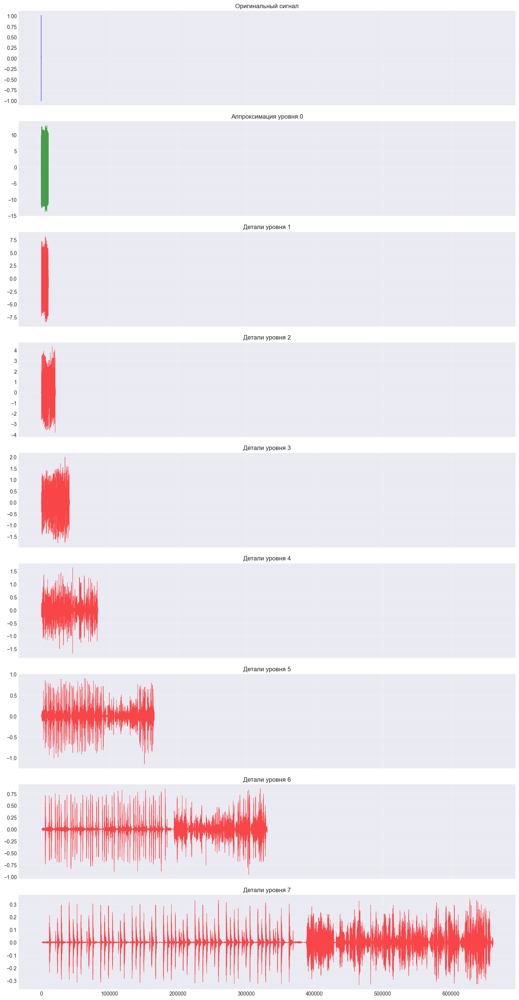

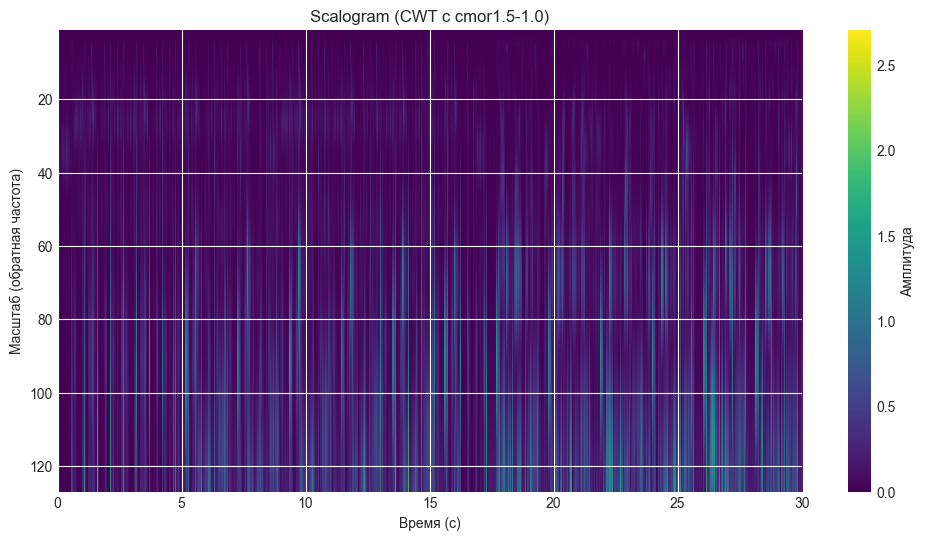


=== audio_2  (text_2.mp3) ===


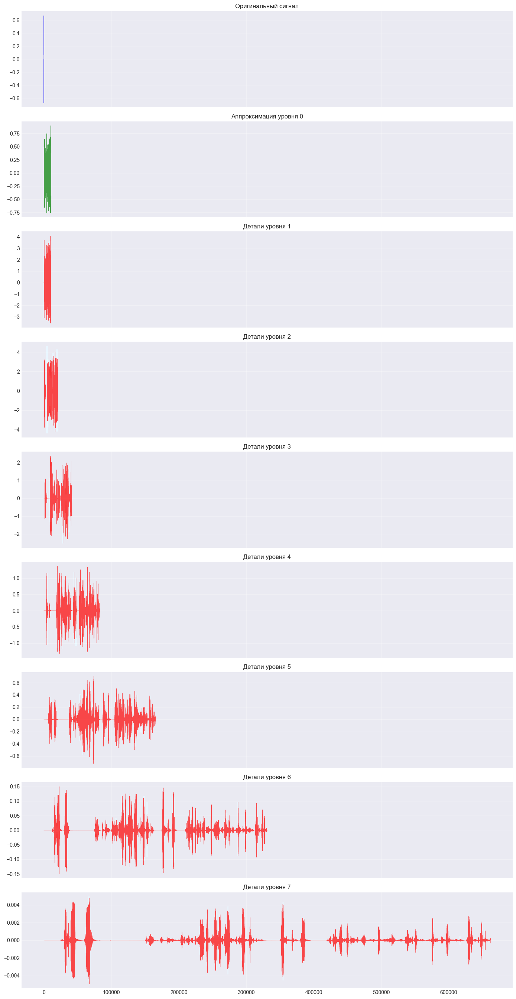

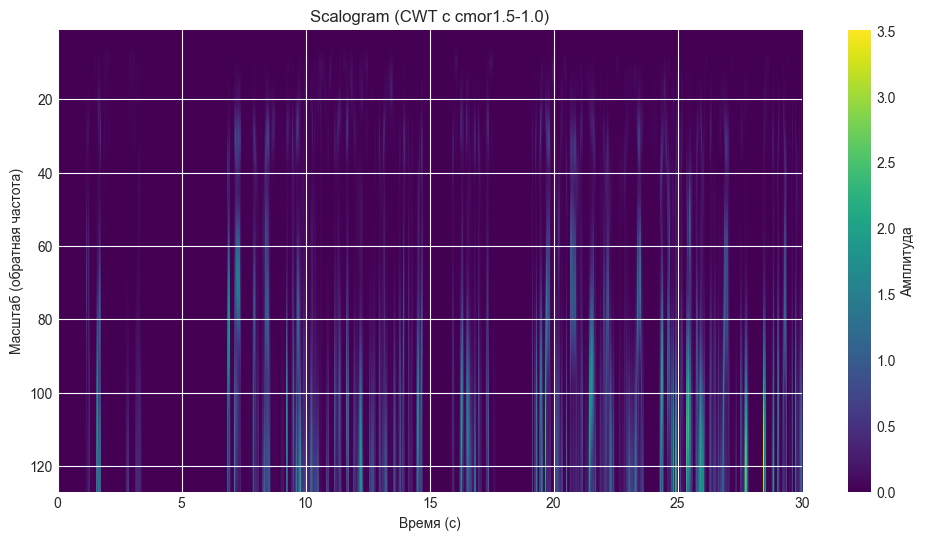


=== audio_3  (street.mp3) ===


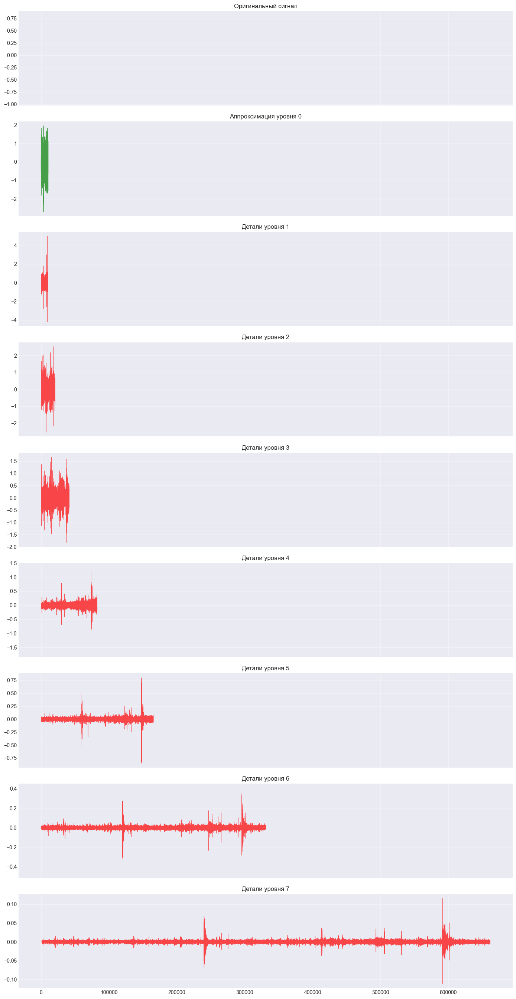

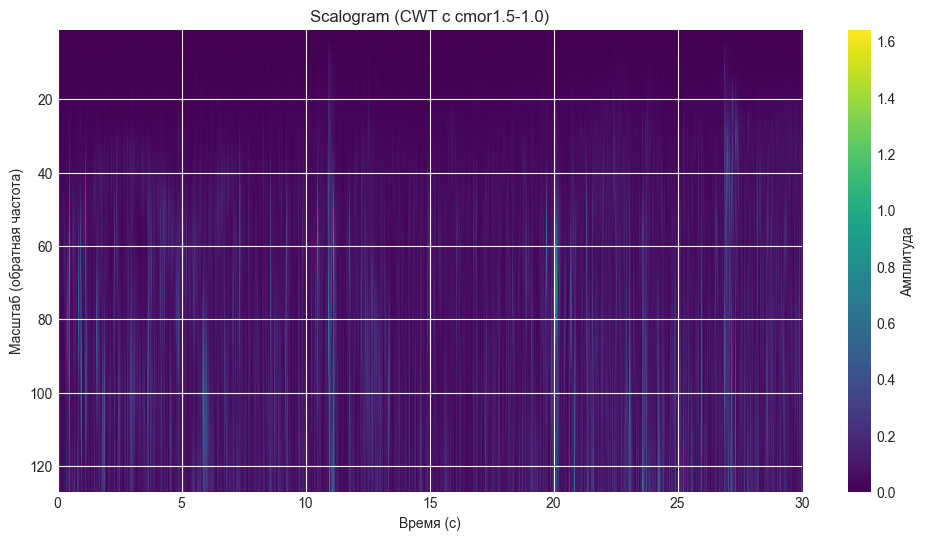


=== audio_4  (rain.mp3) ===


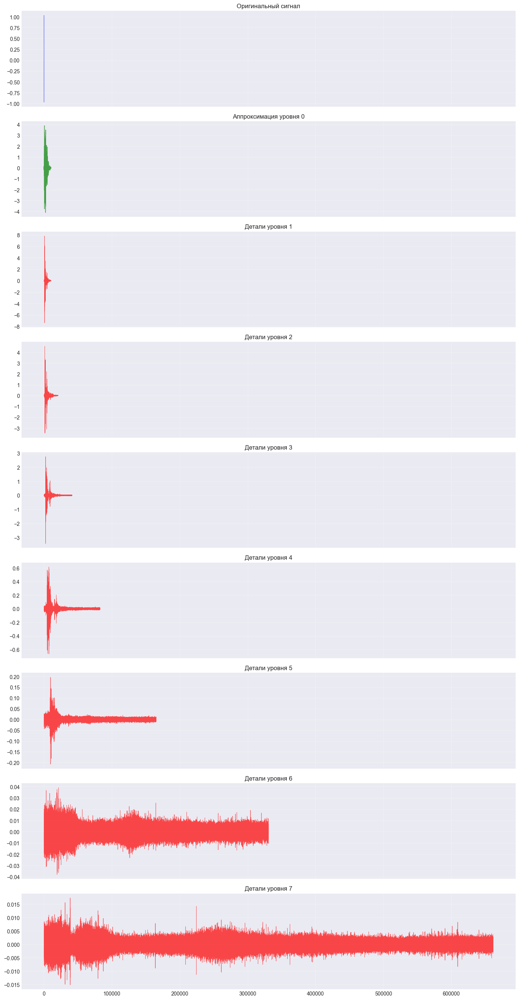

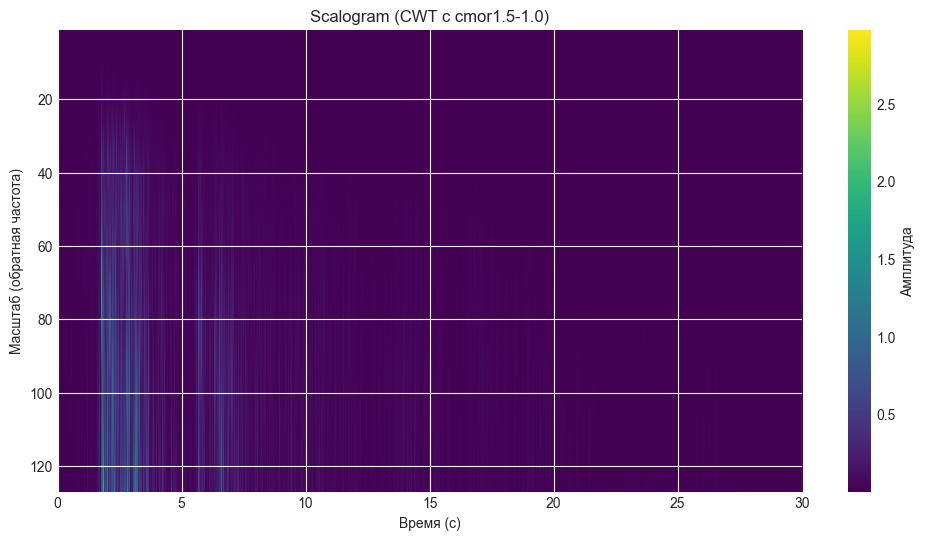


=== audio_5  (birds.mp3) ===


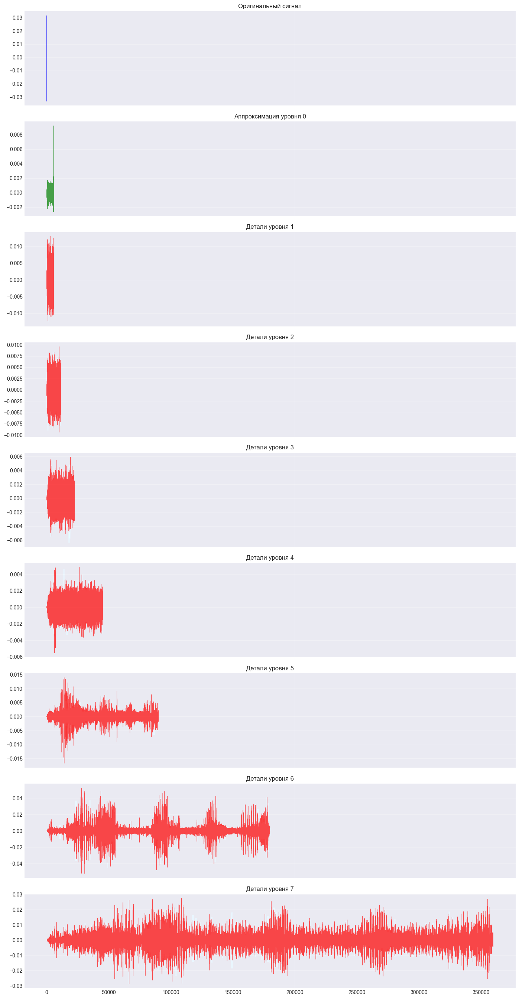

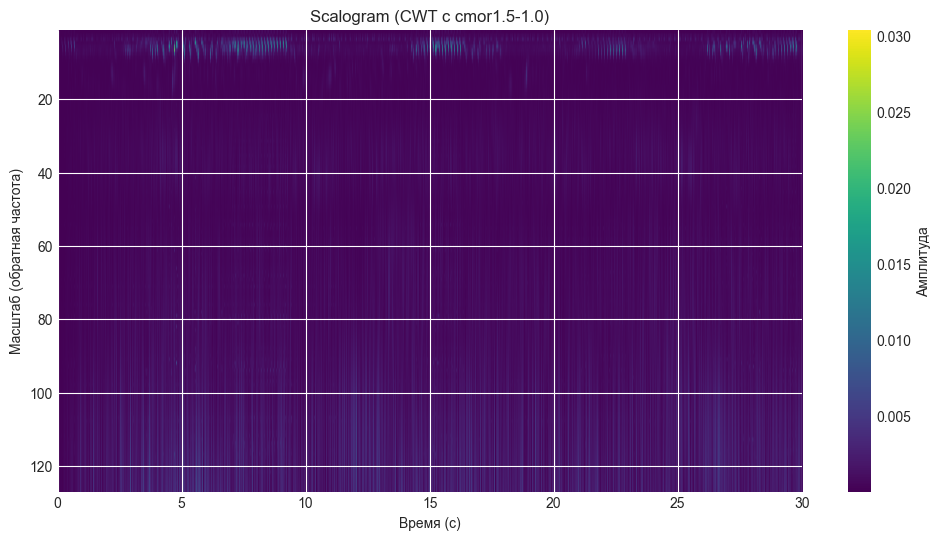

In [24]:
for key in loaded_audio:
    print(f"\n=== {key}  ({loaded_audio[key]['filename']}) ===")
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    y_short = y[:sr * 30]

    plot_wavelet_spectrogram(
    y_short,
    sr,
    dwt_wavelet = 'db8',          # или 'sym5', 'coif5', 'bior4.4' — дискретные
    cwt_wavelet = 'cmor1.5-1.0',  # или 'morl', 'cgau5', 'mexh'
    level = 7                     # можно 5–8
)

Загрузка файла 1: music.mp3
Частота дискретизации: 44100 Hz
Длительность: 119.51 секунд
Отсчетов: 5270400

Загрузка файла 2: text_2.mp3
Частота дискретизации: 44100 Hz
Длительность: 185.63 секунд
Отсчетов: 8186283

Загрузка файла 3: street.mp3
Частота дискретизации: 44100 Hz
Длительность: 53.47 секунд
Отсчетов: 2358144

Загрузка файла 4: rain.mp3
Частота дискретизации: 44100 Hz
Длительность: 41.77 секунд
Отсчетов: 1841859

Загрузка файла 5: birds.mp3
Частота дискретизации: 24000 Hz
Длительность: 60.38 секунд
Отсчетов: 1449134

Загружено файлов: 5/5


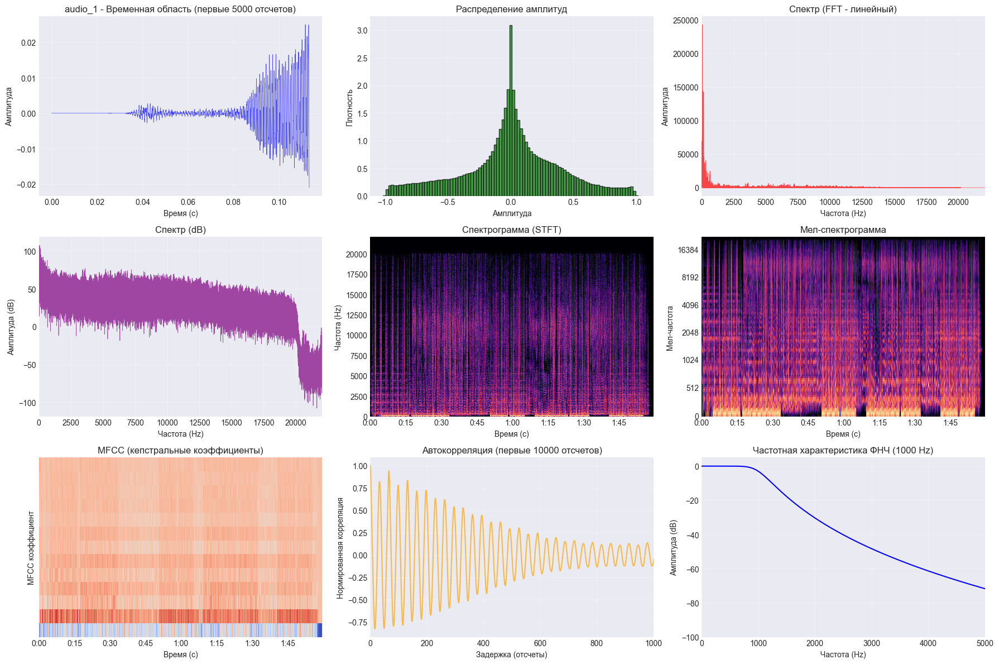

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import signal
import librosa
import librosa.display
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

audio_files = [
    "music.mp3",
    "text_2.mp3",
    "street.mp3",
    "rain.mp3",
    "birds.mp3"
]

loaded_audio = {}
for i, file_path in enumerate(audio_files):
    try:
        print(f"Загрузка файла {i+1}: {file_path}")
        y, sr = librosa.load(file_path, sr=None)
        loaded_audio[f"audio_{i+1}"] = {
            'signal': y,
            'sr': sr,
            'filename': file_path
        }
        print(f"Частота дискретизации: {sr} Hz")
        print(f"Длительность: {len(y)/sr:.2f} секунд")
        print(f"Отсчетов: {len(y)}\n")
    except Exception as e:
        print(f"Ошибка загрузки: {e}\n")

print(f"Загружено файлов: {len(loaded_audio)}/{len(audio_files)}")

if loaded_audio:
    key = list(loaded_audio.keys())[0]
    y = loaded_audio[key]['signal']
    sr = loaded_audio[key]['sr']

    fig, axes = plt.subplots(3, 3, figsize=(18, 12))

    time = np.arange(len(y)) / sr
    axes[0, 0].plot(time[:5000], y[:5000], color='blue', alpha=0.7, linewidth=0.5)
    axes[0, 0].set_title(f'{key} - Временная область (первые 5000 отсчетов)')
    axes[0, 0].set_xlabel('Время (с)')
    axes[0, 0].set_ylabel('Амплитуда')
    axes[0, 0].grid(True, alpha=0.3)

    axes[0, 1].hist(y, bins=100, density=True, alpha=0.7, color='green', edgecolor='black')
    axes[0, 1].set_title('Распределение амплитуд')
    axes[0, 1].set_xlabel('Амплитуда')
    axes[0, 1].set_ylabel('Плотность')
    axes[0, 1].grid(True, alpha=0.3)

    n = len(y)
    Y = np.fft.fft(y)
    Y_mag = np.abs(Y[:n//2])
    freq = np.fft.fftfreq(n, 1/sr)[:n//2]

    axes[0, 2].plot(freq, Y_mag, color='red', alpha=0.7, linewidth=0.5)
    axes[0, 2].set_title('Спектр (FFT - линейный)')
    axes[0, 2].set_xlabel('Частота (Hz)')
    axes[0, 2].set_ylabel('Амплитуда')
    axes[0, 2].set_xlim([0, sr/2])
    axes[0, 2].grid(True, alpha=0.3)

    axes[1, 0].plot(freq, 20*np.log10(Y_mag + 1e-10), color='purple', alpha=0.7, linewidth=0.5)
    axes[1, 0].set_title('Спектр (dB)')
    axes[1, 0].set_xlabel('Частота (Hz)')
    axes[1, 0].set_ylabel('Амплитуда (dB)')
    axes[1, 0].set_xlim([0, sr/2])
    axes[1, 0].grid(True, alpha=0.3)

    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', ax=axes[1, 1])
    axes[1, 1].set_title('Спектрограмма (STFT)')
    axes[1, 1].set_xlabel('Время (с)')
    axes[1, 1].set_ylabel('Частота (Hz)')

    mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    librosa.display.specshow(mel_spec_db, sr=sr, x_axis='time', y_axis='mel', ax=axes[1, 2])
    axes[1, 2].set_title('Мел-спектрограмма')
    axes[1, 2].set_xlabel('Время (с)')
    axes[1, 2].set_ylabel('Мел-частота')

    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    librosa.display.specshow(mfccs, sr=sr, x_axis='time', ax=axes[2, 0])
    axes[2, 0].set_title('MFCC (кепстральные коэффициенты)')
    axes[2, 0].set_xlabel('Время (с)')
    axes[2, 0].set_ylabel('MFCC коэффициент')

    segment_length = min(10000, len(y))
    correlation = np.correlate(y[:segment_length], y[:segment_length], mode='full')
    correlation = correlation[segment_length-1:]  # Берем только правую половину
    correlation = correlation / correlation[0]  # Нормализация

    lags = np.arange(len(correlation))
    axes[2, 1].plot(lags, correlation, color='orange', alpha=0.7)
    axes[2, 1].set_title('Автокорреляция (первые 10000 отсчетов)')
    axes[2, 1].set_xlabel('Задержка (отсчеты)')
    axes[2, 1].set_ylabel('Нормированная корреляция')
    axes[2, 1].set_xlim([0, 1000])
    axes[2, 1].grid(True, alpha=0.3)

    nyquist = sr / 2
    cutoff = 1000
    order = 5
    b, a = signal.butter(order, cutoff/nyquist, btype='low')

    # Частотная характеристика фильтра
    w, h = signal.freqz(b, a, worN=8000)
    freq_filter = (w / np.pi) * nyquist
    axes[2, 2].plot(freq_filter, 20 * np.log10(abs(h)), 'b')
    axes[2, 2].set_title('Частотная характеристика ФНЧ (1000 Hz)')
    axes[2, 2].set_xlabel('Частота (Hz)')
    axes[2, 2].set_ylabel('Амплитуда (dB)')
    axes[2, 2].set_xlim([0, 5000])
    axes[2, 2].set_ylim([-100, 5])
    axes[2, 2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()